In [1]:
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

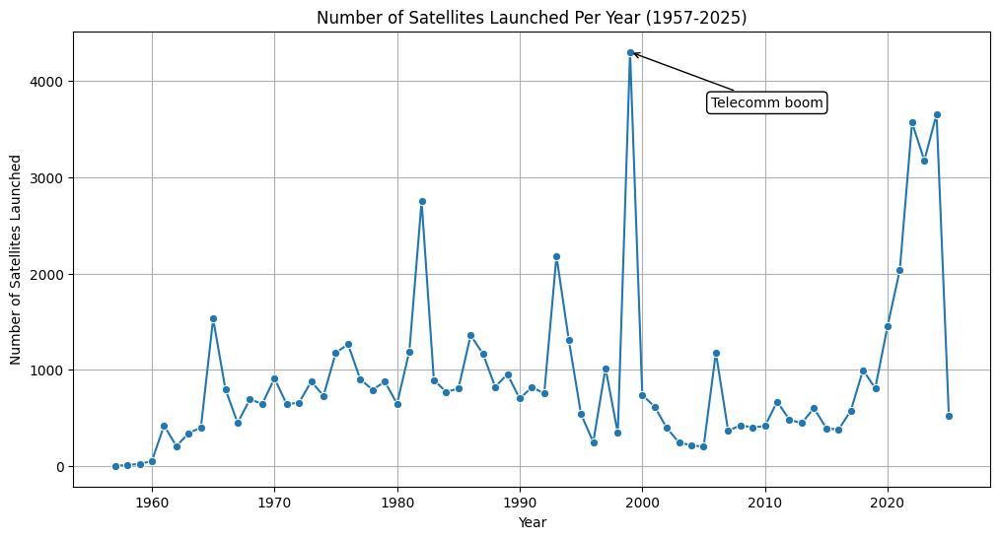

In [2]:
df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)
df['Year'] = pd.to_datetime(df['LDate'], errors='coerce').dt.year
launches_per_year = df.groupby('Year').size().reset_index(name='Count')

plt.figure(figsize=(12, 6))
sns.lineplot(data=launches_per_year, x='Year', y='Count', marker='o')
plt.title('Number of Satellites Launched Per Year (1957-2025)')
plt.xlabel('Year')
plt.ylabel('Number of Satellites Launched')
plt.grid(True)
plt.annotate(
    'Telecomm boom',
    xy=(1999,4300),  
    xytext=(100, -40), 
    textcoords='offset points',
    ha='center',
    fontsize=10,
    bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'),
    arrowprops=dict(arrowstyle='->', color='black')  
)

plt.show()

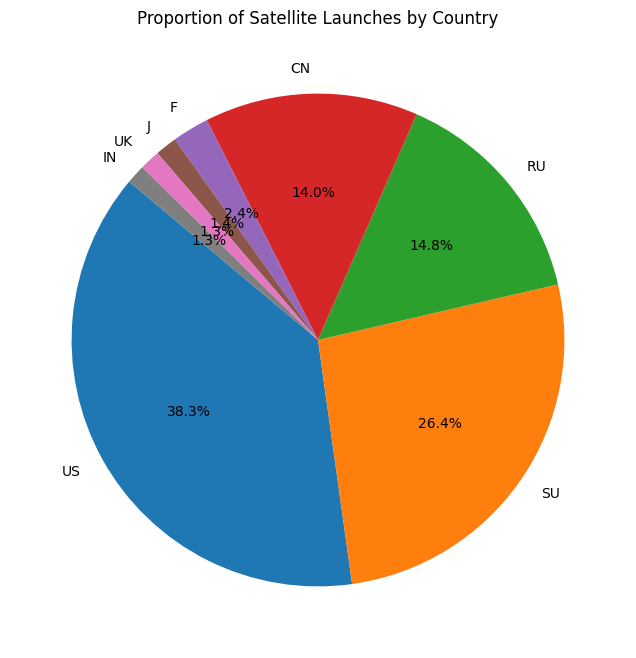

In [3]:
df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)
launches_by_country = df['State'].value_counts()

countries = ['US', 'SU', 'RU','CN','F','J','UK','IN']
df_filtered = df[df['State'].isin(countries)]

launches_by_country = df_filtered['State'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(launches_by_country, labels=launches_by_country.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Satellite Launches by Country')
plt.show()

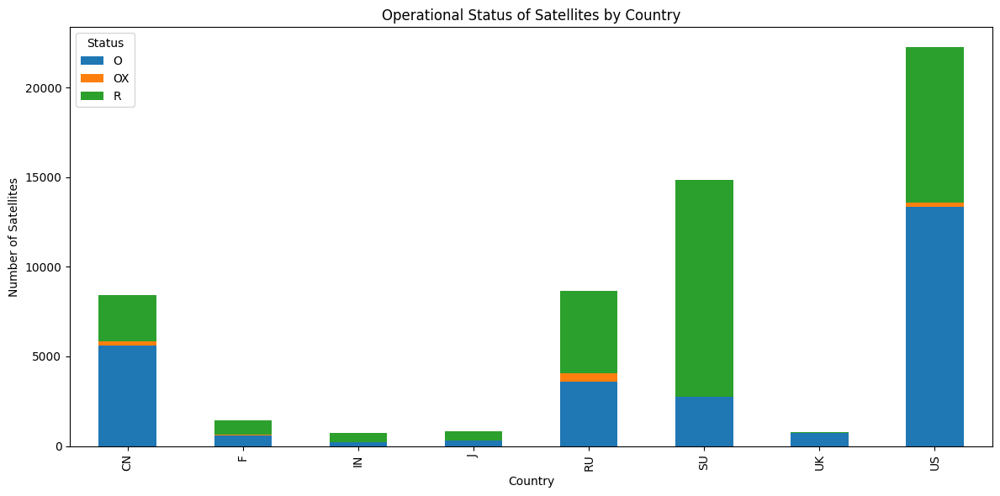

In [4]:
df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)


# Filter the data by country
countries = ['US', 'SU', 'RU', 'CN', 'F', 'J', 'UK', 'IN']
df_filtered = df[df['State'].isin(countries)]

# Focus on the important statuses
important_statuses = ['O', 'R', 'OX']
df_filtered = df_filtered[df_filtered['Status'].isin(important_statuses)]

# Count the number of satellites for each operational status by country
status_counts = df_filtered.groupby(['State', 'Status']).size().unstack().fillna(0)

# Plot the data
status_counts.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Operational Status of Satellites by Country')
plt.xlabel('Country')
plt.ylabel('Number of Satellites')
plt.legend(title='Status')
plt.tight_layout()
plt.show()

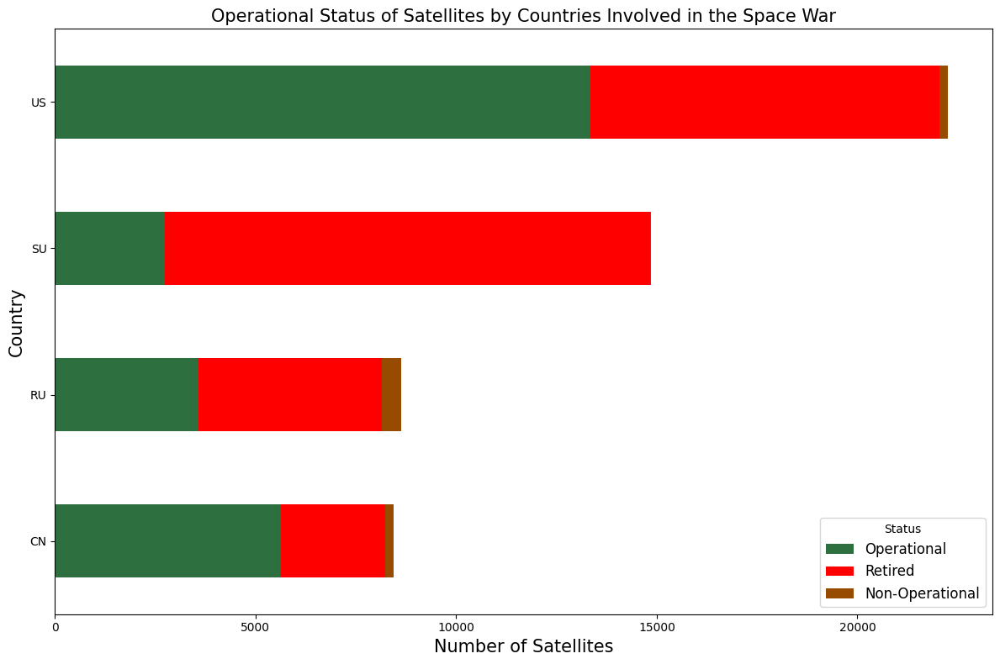

In [5]:
df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

countries = ['US', 'SU', 'RU', 'CN']
df_filtered = df[df['State'].isin(countries)]

status_mapping = {'O': 'Operational', 'R': 'Retired', 'OX': 'Non-Operational'}
df_filtered = df_filtered[df_filtered['Status'].isin(status_mapping.keys())]

df_filtered['Status'] = df_filtered['Status'].map(status_mapping)

status_counts = df_filtered.groupby(['State', 'Status']).size().unstack().fillna(0)

status_counts = status_counts[['Operational', 'Retired', 'Non-Operational']]

status_counts['Total'] = status_counts.sum(axis=1)

status_counts = status_counts.sort_values(by='Total', ascending=True).drop(columns='Total')

status_counts.plot(kind='barh', stacked=True, figsize=(12, 8),
                   color={'Operational': '#2E6F40', 'Retired': '#FF0000', 'Non-Operational': '#964B00'})
plt.title('Operational Status of Satellites by Countries Involved in the Space War',fontsize=15)
plt.xlabel('Number of Satellites',fontsize=15)
plt.ylabel('Country',fontsize=15)
plt.legend(title='Status', fontsize=12)
plt.tight_layout()
plt.show()

/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/1069825869.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DDate'] = pd.to_datetime(df['DDate'], errors='coerce')


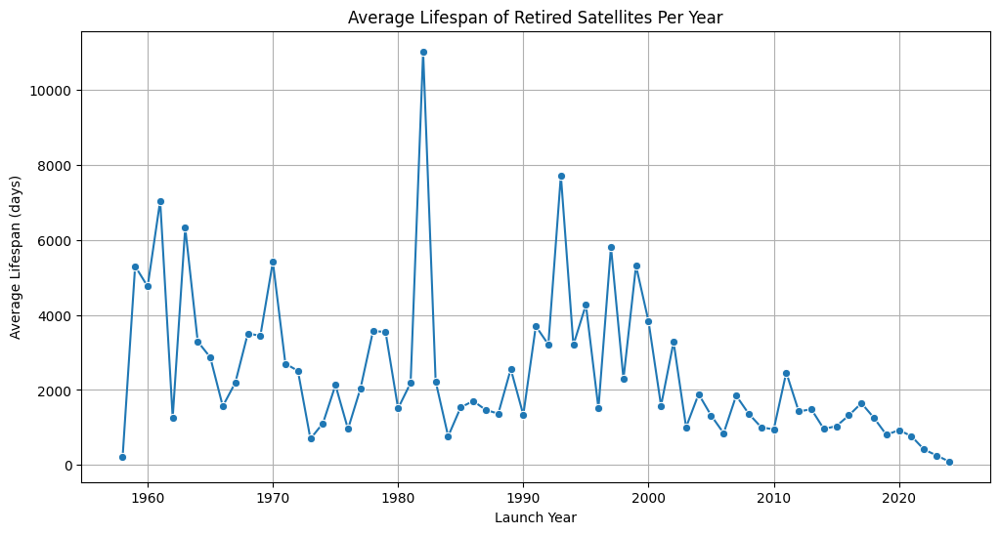

In [6]:
df['LDate'] = pd.to_datetime(df['LDate'], errors='coerce')
df['DDate'] = pd.to_datetime(df['DDate'], errors='coerce')

# Filter out rows with missing 'DDate'
df = df.dropna(subset=['DDate'])

# Calculate the lifespan of each satellite
df['Lifespan'] = (df['DDate'] - df['LDate']).dt.days

# Extract the launch year
df['Launch_Year'] = df['LDate'].dt.year

# Filter only retired satellites
retired_df = df[df['Status'].isin(['R', 'AR', 'DSO', 'N'])]

# Calculate the average lifespan per launch year for retired satellites
average_lifespan_per_year_retired = retired_df.groupby('Launch_Year')['Lifespan'].mean().reset_index()

# Plot the data
plt.figure(figsize=(12, 6))
sns.lineplot(data=average_lifespan_per_year_retired, x='Launch_Year', y='Lifespan', marker='o')
plt.title('Average Lifespan of Retired Satellites Per Year')
plt.xlabel('Launch Year')
plt.ylabel('Average Lifespan (days)')
plt.grid(True)
plt.show()

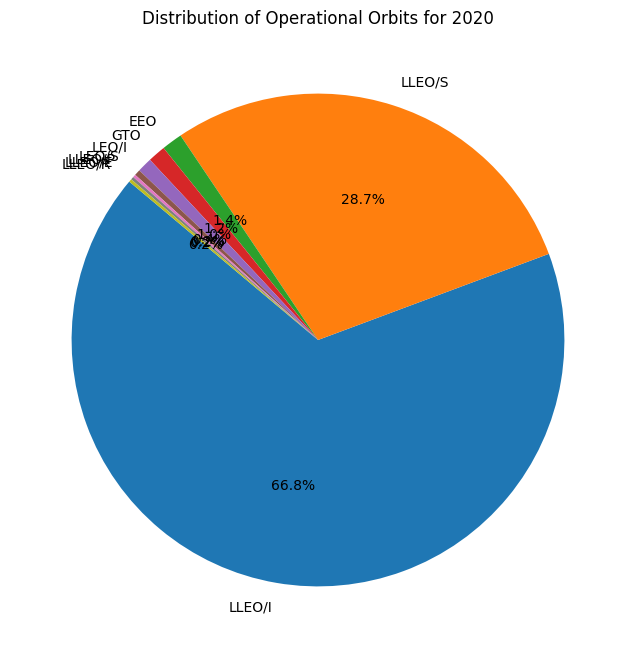

In [7]:
df['Launch_Year'] = pd.to_datetime(df['LDate']).dt.year

# Filter the data by year (Example: 2020)
year = 2020
df_year = df[df['Launch_Year'] == year]

# Count the number of satellites for each operational orbit
oporbit_counts_year = df_year['OpOrbit'].value_counts()

# Plot the data
plt.figure(figsize=(8, 8))
plt.pie(oporbit_counts_year, labels=oporbit_counts_year.index, autopct='%1.1f%%', startangle=140)
plt.title(f'Distribution of Operational Orbits for {year}')
plt.show()

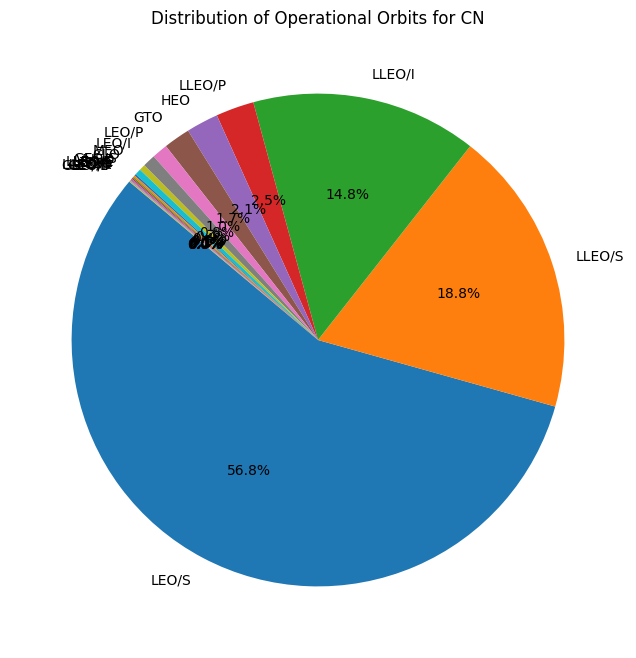

In [8]:
country = 'CN'
df_country = df[df['State'] == country]

# Count the number of satellites for each operational orbit
oporbit_counts = df_country['OpOrbit'].value_counts()

# Plot the data
plt.figure(figsize=(8, 8))
plt.pie(oporbit_counts, labels=oporbit_counts.index, autopct='%1.1f%%', startangle=140)
plt.title(f'Distribution of Operational Orbits for {country}')
plt.show()

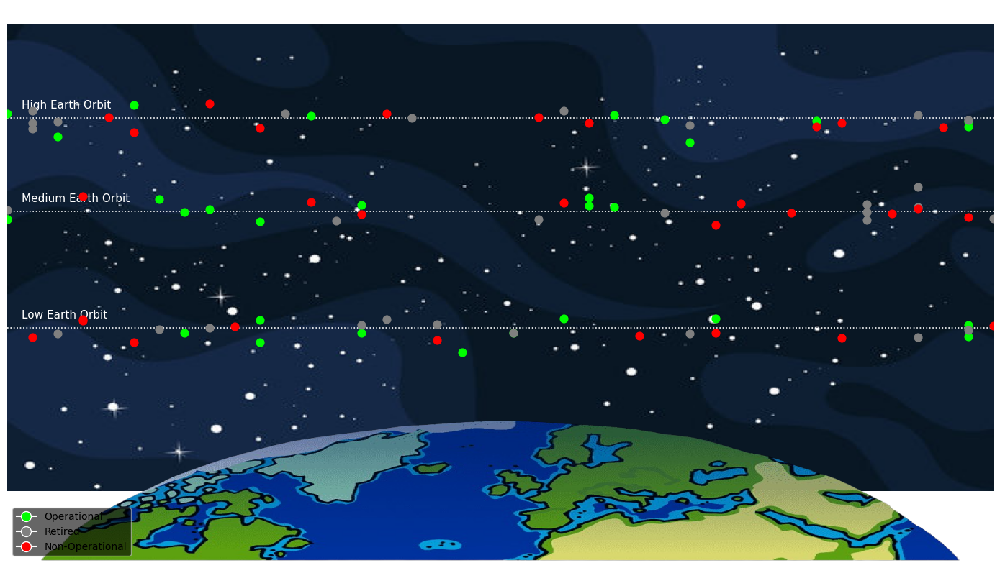

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os

# Load images
space_bg = mpimg.imread("space_background.jpg")  # Must be widescreen-ish
earth_img = mpimg.imread("earth_half.png")       # Bottom half of Earth

# Setup
fig, ax = plt.subplots(figsize=(14, 8))

# Display starry background
ax.imshow(space_bg, extent=[1957, 2025, 0, 10], aspect='auto')

# Place Earth at the bottom
ax.imshow(earth_img, extent=[1957, 2025, -1.5, 1.5], aspect='auto', zorder=3)

# Orbit Bands
orbits = {
    'Low Earth Orbit': 3.5,
    'Medium Earth Orbit': 6,
    'High Earth Orbit': 8
}
for name, y in orbits.items():
    ax.hlines(y, xmin=1957, xmax=2025, color='white', linestyle='dotted', linewidth=1.2)
    ax.text(1958, y + 0.2, name, color='white', fontsize=11)

# Generate random satellite positions (for illustration)
np.random.seed(42)
years = np.linspace(1957, 2025, 40)
sat_types = ['Operational', 'Retired', 'Non-Operational']
colors = {'Operational': 'lime', 'Retired': 'grey', 'Non-Operational': 'red'}

for orbit_name, y_base in orbits.items():
    for sat_type in sat_types:
        x_vals = np.random.choice(years, 10)
        y_vals = y_base + np.random.normal(0, 0.2, size=10)
        ax.scatter(x_vals, y_vals, color=colors[sat_type], s=60, label=sat_type if orbit_name == 'Low Earth Orbit' else "", zorder=4)

# Decorations
ax.set_xlim(1957, 2025)
ax.set_ylim(-1.5, 10)
ax.set_title("Satellites in Orbit Over Time", color='white', fontsize=16)
ax.axis('off')

# Custom Legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Operational', markerfacecolor='lime', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Retired', markerfacecolor='grey', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Non-Operational', markerfacecolor='red', markersize=10)
]
ax.legend(handles=legend_elements, loc='lower left', facecolor='black', framealpha=0.6)

plt.tight_layout()
plt.show()


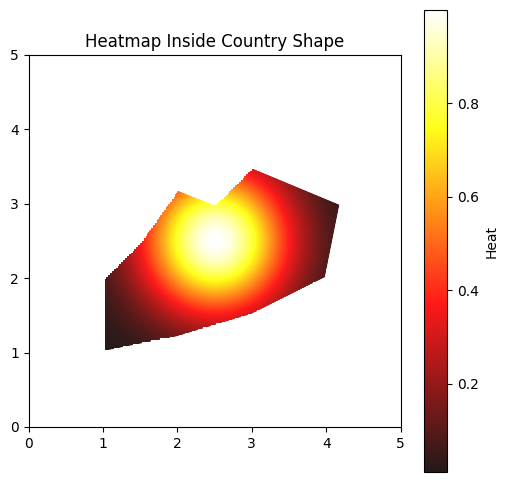

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.path import Path

# Create a fake country polygon (just for demo)
country_coords = np.array([
    [1, 1], [2, 1.2], [3, 1.5], [4, 2], [4.2, 3], [3, 3.5],
    [2.5, 3], [2, 3.2], [1.5, 2.5], [1, 2]
])
country_path = Path(country_coords)

# Create a grid of points (heatmap basis)
x = np.linspace(0, 5, 200)
y = np.linspace(0, 5, 200)
xx, yy = np.meshgrid(x, y)

# Create a heatmap (e.g., random or based on data)
heat = np.exp(-((xx - 2.5)**2 + (yy - 2.5)**2))  # Gaussian blob

# Mask outside the country polygon
points = np.vstack((xx.flatten(), yy.flatten())).T
mask = ~country_path.contains_points(points)
heat_masked = heat.copy()
heat_masked.flat[mask] = np.nan  # Mask values outside

# Plot
fig, ax = plt.subplots(figsize=(6, 6))
hm = ax.imshow(heat_masked, extent=(0, 5, 0, 5), origin='lower', cmap='hot', alpha=0.9)

# Overlay country outline
ax.plot(*country_coords.T, color='white', linewidth=2)
ax.fill(*country_coords.T, edgecolor='white', facecolor='none', lw=2)

plt.colorbar(hm, label='Heat')
ax.set_title("Heatmap Inside Country Shape")
plt.show()


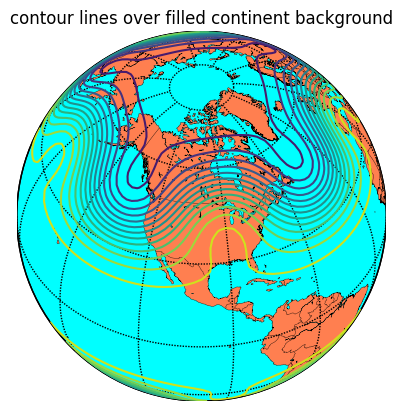

In [11]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
# set up orthographic map projection with
# perspective of satellite looking down at 45N, 100W.
# use low resolution coastlines.
map = Basemap(projection='ortho',lat_0=45,lon_0=-100,resolution='l')
# draw coastlines, country boundaries, fill continents.
map.drawcoastlines(linewidth=0.25)
map.drawcountries(linewidth=0.25)
map.fillcontinents(color='coral',lake_color='aqua')
# draw the edge of the map projection region (the projection limb)
map.drawmapboundary(fill_color='aqua')
# draw lat/lon grid lines every 30 degrees.
map.drawmeridians(np.arange(0,360,30))
map.drawparallels(np.arange(-90,90,30))
# make up some data on a regular lat/lon grid.
nlats = 73; nlons = 145; delta = 2.*np.pi/(nlons-1)
lats = (0.5*np.pi-delta*np.indices((nlats,nlons))[0,:,:])
lons = (delta*np.indices((nlats,nlons))[1,:,:])
wave = 0.75*(np.sin(2.*lats)**8*np.cos(4.*lons))
mean = 0.5*np.cos(2.*lats)*((np.sin(2.*lats))**2 + 2.)
# compute native map projection coordinates of lat/lon grid.
x, y = map(lons*180./np.pi, lats*180./np.pi)
# contour data over the map.
cs = map.contour(x,y,wave+mean,15,linewidths=1.5)
plt.title('contour lines over filled continent background')
plt.show()

In [12]:
import plotly.graph_objects as go

fig = go.Figure()

# Earth sphere
fig.add_trace(go.Scatter3d(
    x=[0], y=[0], z=[0],
    mode='markers',
    marker=dict(size=20, color='blue'),
    name='Earth'
))

# Add a satellite orbit
import numpy as np
theta = np.linspace(0, 2 * np.pi, 100)
r = 10
x = r * np.cos(theta)
y = r * np.sin(theta)
z = r * np.sin(2 * theta)

fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='lines', name='Orbit'))

fig.update_layout(scene=dict(aspectmode="data"), title="Earth with Orbit Path")
fig.show()


/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/1913593880.py:78: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/1913593880.py:111: UserWarning:

Glyph 128752 (\N{SATELLITE}) missing from current font.

/Users/ziad/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 128752 (\N{SATELLITE}) missing from current font.



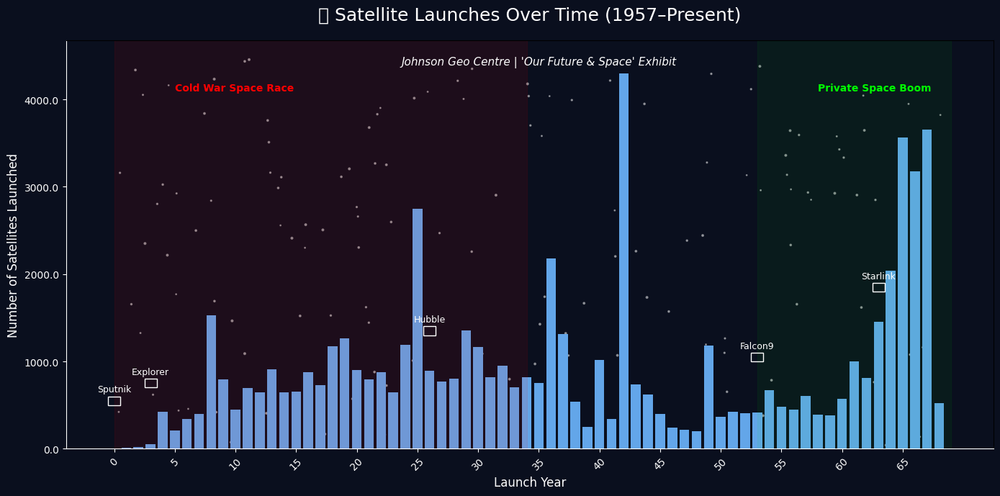

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patches as patches

df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

df_clean = df.copy()

# Step 2: Parse 'LDate' (launch date) into datetime format
df_clean['Launch_Date'] = pd.to_datetime(df_clean['LDate'], errors='coerce')

# Step 3: Extract Launch Year for trend analysis
df_clean['Launch_Year'] = df_clean['Launch_Date'].dt.year

# Step 4: Clean and standardize 'Owner' (country of origin)
df_clean['Owner'] = df_clean['Owner'].str.strip()

# Step 5: Clean and categorize orbital types from 'OpOrbit'
# We'll simplify them to LEO, MEO, GEO, HEO, UNKNOWN
def simplify_orbit(orbit):
    if pd.isnull(orbit):
        return "UNKNOWN"
    orbit = orbit.upper()
    if 'LEO' in orbit:
        return 'LEO'
    elif 'MEO' in orbit:
        return 'MEO'
    elif 'GEO' in orbit or 'GSO' in orbit:
        return 'GEO'
    elif 'HEO' in orbit or 'H' in orbit:
        return 'HEO'
    else:
        return 'OTHER'

df_clean['Orbit_Class'] = df_clean['OpOrbit'].apply(simplify_orbit)

# Step 6: Clean status
df_clean['Status'] = df_clean['Status'].str.strip().fillna("Unknown")

# Step 7: Drop rows with missing key values we care about for now
df_clean = df_clean.dropna(subset=["Launch_Year", "Owner", "Orbit_Class"])

# Preview cleaned dataset
df_clean[["Name", "Owner", "Launch_Year", "Orbit_Class", "Status"]].head()


# Load cleaned satellite launch data (replace this with your loaded df_clean)
# df_clean = your cleaned dataframe from earlier
# Example cleanup if not done yet:
# df_clean['Launch_Year'] = pd.to_datetime(df_clean['LDate'], errors='coerce').dt.year

# Timeline data
launch_timeline = df_clean.groupby("Launch_Year").size().reset_index(name="Satellite_Count")
launch_timeline = launch_timeline[launch_timeline["Launch_Year"] >= 1957]

# Create figure
fig, ax = plt.subplots(figsize=(14, 7))
sns.barplot(data=launch_timeline, x="Launch_Year", y="Satellite_Count", color="#4da6ff", ax=ax)

# Background colors
ax.set_facecolor("#0a0f1e")
fig.patch.set_facecolor('#0a0f1e')

# Add starfield
np.random.seed(42)
star_x = np.random.uniform(0, len(launch_timeline), 150)
star_y = np.random.uniform(0, 4500, 150)
ax.scatter(star_x, star_y, color='white', s=np.random.uniform(1, 4, 150), alpha=0.4, zorder=0)

# Axes and ticks styling
ax.tick_params(colors='white')
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')
ax.set_xticks(ax.get_xticks()[::5])
ax.set_xticklabels([str(int(label)) for label in ax.get_xticks()], rotation=45, color='white')
ax.set_yticklabels(ax.get_yticks(), color='white')

# Labels
ax.set_xlabel("Launch Year", fontsize=12, color='white')
ax.set_ylabel("Number of Satellites Launched", fontsize=12, color='white')
ax.set_title("🛰 Satellite Launches Over Time (1957–Present)", fontsize=18, color='white', pad=20)

# Highlight eras
ax.axvspan(0, 34, color='red', alpha=0.08)
ax.text(5, 4100, "Cold War Space Race", color='red', fontsize=10, weight='bold')
ax.axvspan(53, len(launch_timeline), color='lime', alpha=0.05)
ax.text(58, 4100, "Private Space Boom", color='lime', fontsize=10, weight='bold')

# Placeholder icon positions (x-offset is relative to year index)
icon_positions = {
    "Sputnik": (0, 500),
    "Explorer": (3, 700),
    "Hubble": (26, 1300),
    "Falcon9": (53, 1000),
    "Starlink": (63, 1800),
}

# Draw placeholder boxes and labels
for label, (xpos, ypos) in icon_positions.items():
    ax.annotate(label, (xpos, ypos + 150), color='white', fontsize=9, ha='center')
    rect = patches.Rectangle((xpos - 0.5, ypos), 1, 100, linewidth=1, edgecolor='white',
                             facecolor='none', zorder=5)
    ax.add_patch(rect)

# Header text
ax.text(35, 4400, "Johnson Geo Centre | 'Our Future & Space' Exhibit", color='white',
        fontsize=11, ha='center', style='italic')

plt.tight_layout()
plt.show()


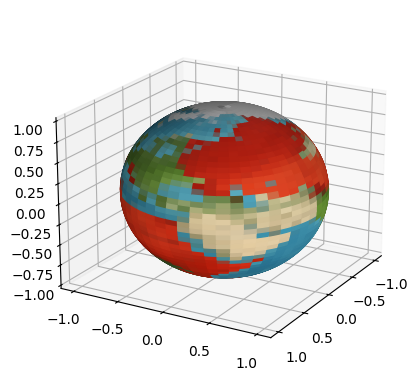

In [14]:
import PIL
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Load the Earth image with PIL
bm = PIL.Image.open('earth2.png')

# Rescale the image, convert to array, and normalize it (divide by 256 for proper RGB values)
bm = np.array(bm.resize([int(d / 5) for d in bm.size])) / 256.

# Coordinates of the image (longitudes and latitudes)
lons = np.linspace(-180, 180, bm.shape[1]) * np.pi / 180  # Longitude values
lats = np.linspace(-90, 90, bm.shape[0])[::-1] * np.pi / 180  # Latitude values

# Set up the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Calculate the 3D coordinates for each point on the globe
x = np.outer(np.cos(lons), np.cos(lats)).T
y = np.outer(np.sin(lons), np.cos(lats)).T
z = np.outer(np.ones(np.size(lons)), np.sin(lats)).T

# Plot the Earth with the image applied to its surface
ax.plot_surface(x, y, z, rstride=4, cstride=4, facecolors=bm)

# Adjust the view to focus on the specific region (e.g., USA, Russia, China)
ax.view_init(elev=20, azim=30)  # Adjust these values for different angles

# Show the plot
plt.show()


NameError: name 'satellite_data_clean' is not defined

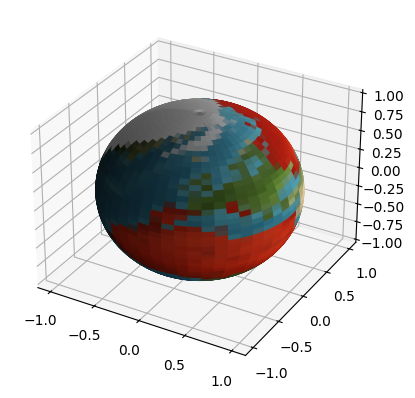

In [15]:
# Re-import the necessary libraries
import PIL
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Load the Earth image
bm = PIL.Image.open('earth2.png')

# Resize and prepare the image
bm = np.array(bm.resize([int(d/5) for d in bm.size])) / 256.  # Scale image

# Coordinates of the image
lons = np.linspace(-180, 180, bm.shape[1]) * np.pi / 180  # Longitude values
lats = np.linspace(-90, 90, bm.shape[0])[::-1] * np.pi / 180  # Latitude values

# Set up the figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the spherical grid to map the image onto
x = np.outer(np.cos(lons), np.cos(lats)).T
y = np.outer(np.sin(lons), np.cos(lats)).T
z = np.outer(np.ones(np.size(lons)), np.sin(lats)).T

# Plot Earth (a simple sphere with the provided image texture)
ax.plot_surface(x, y, z, rstride=4, cstride=4, facecolors=bm)

# Function to convert orbital parameters to Cartesian coordinates for satellite placement
def orbital_to_cartesian(perigee, apogee, inclination, num_points=10):
    # Convert inclination to radians
    inclination = np.radians(inclination)
    
    # Create the orbit (simplified elliptical orbit)
    theta = np.linspace(0, 2 * np.pi, num_points)
    r = (apogee - perigee) / 2 * (1 + np.cos(theta)) + perigee  # Semi-major axis varies with theta
    
    # Orbital position in spherical coordinates
    x_orbit = r * np.cos(theta)  # x = r * cos(theta)
    y_orbit = r * np.sin(theta)  # y = r * sin(theta)
    z_orbit = r * np.sin(inclination)  # Adjust z based on inclination
    
    return x_orbit, y_orbit, z_orbit

# Plot satellites above the Earth
for idx, row in satellite_data_clean.iterrows():
    name = row['Name']
    perigee = row['Perigee']
    apogee = row['Apogee']
    inclination = row['Inc']
    
    # Get satellite's orbital position
    x_orbit, y_orbit, z_orbit = orbital_to_cartesian(perigee, apogee, inclination)
    
    # Plot the satellite's orbit (as points along the orbit)
    ax.scatter(x_orbit, y_orbit, z_orbit, label=f'Satellite: {name}', s=50)

# Adjust the viewing angle to focus on the countries of interest (USA, Russia, China)
ax.view_init(elev=20, azim=-50)  # Adjust the elevation and azimuth

# Labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Earth with Satellites Over USA, Russia, and China')

# Show the legend
ax.legend()

# Display the plot
plt.show()


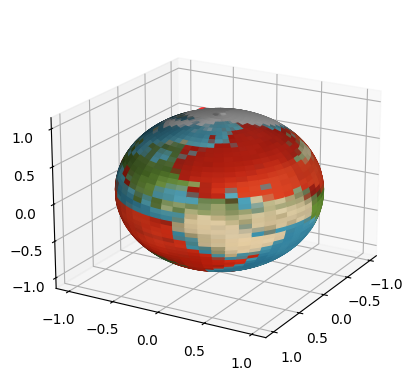

In [16]:
import PIL
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Load the Earth image with PIL
bm = PIL.Image.open('earth2.png')

# Rescale the image, convert to array, and normalize it (divide by 256 for proper RGB values)
bm = np.array(bm.resize([int(d / 5) for d in bm.size])) / 256.

# Coordinates of the image (longitudes and latitudes)
lons = np.linspace(-180, 180, bm.shape[1]) * np.pi / 180  # Longitude values
lats = np.linspace(-90, 90, bm.shape[0])[::-1] * np.pi / 180  # Latitude values

# Set up the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Calculate the 3D coordinates for each point on the globe
x = np.outer(np.cos(lons), np.cos(lats)).T
y = np.outer(np.sin(lons), np.cos(lats)).T
z = np.outer(np.ones(np.size(lons)), np.sin(lats)).T

# Plot the Earth with the image applied to its surface
ax.plot_surface(x, y, z, rstride=4, cstride=4, facecolors=bm)

# Example coordinates for scatter plot: latitudes and longitudes of cities (e.g., New York, London, Sydney)
scatter_lons = np.array([-74.006, -0.1276, 151.2093]) * np.pi / 180  # Longitudes (New York, London, Sydney)
scatter_lats = np.array([80.7128, 51.5074, -33.8688]) * np.pi / 180  # Latitudes (New York, London, Sydney)

# Calculate the 3D coordinates for the scatter plot points
scatter_x = np.cos(scatter_lons) * np.cos(scatter_lats)
scatter_y = np.sin(scatter_lons) * np.cos(scatter_lats)
scatter_z = np.sin(scatter_lats)

# Plot the scatter points on the surface of the globe
ax.scatter(scatter_x, scatter_y, scatter_z, color='r', s=100)  # Red points, size 100

# Adjust the view to focus on the specific region (e.g., USA, Russia, China)
ax.view_init(elev=20, azim=30)  # Adjust these values for different angles

# Show the plot
plt.show()


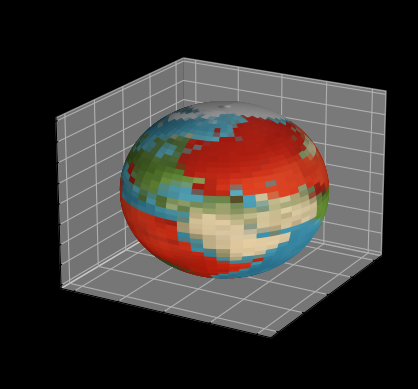

In [17]:
import PIL
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Load the Earth image with PIL
bm = PIL.Image.open('earth2.png')

# Rescale the image, convert to array, and normalize it (divide by 256 for proper RGB values)
bm = np.array(bm.resize([int(d / 5) for d in bm.size])) / 256.

# Coordinates of the image (longitudes and latitudes)
lons = np.linspace(-180, 180, bm.shape[1]) * np.pi / 180  # Longitude values
lats = np.linspace(-90, 90, bm.shape[0])[::-1] * np.pi / 180  # Latitude values

# Set up the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Set the background color to black (space-like)
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# Calculate the 3D coordinates for each point on the globe
x = np.outer(np.cos(lons), np.cos(lats)).T
y = np.outer(np.sin(lons), np.cos(lats)).T
z = np.outer(np.ones(np.size(lons)), np.sin(lats)).T

# Plot the Earth with the image applied to its surface
ax.plot_surface(x, y, z, rstride=4, cstride=4, facecolors=bm)

# Adjust the view to focus on the specific region (e.g., USA, Russia, China)
ax.view_init(elev=20, azim=30)  # Adjust these values for different angles

# Show the plot
plt.show()


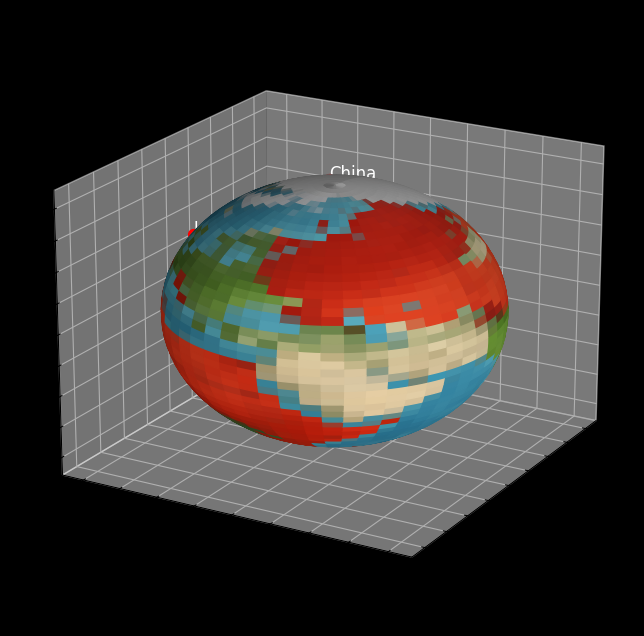

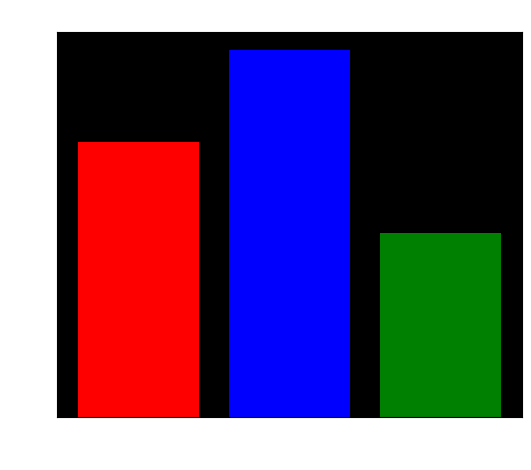

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import PIL

# Load the Earth image with PIL
bm = PIL.Image.open('earth2.png')  # Update with your image path
bm = np.array(bm.resize([int(d / 5) for d in bm.size])) / 256.  # Normalize

# Coordinates of the image (longitudes and latitudes)
lons = np.linspace(-180, 180, bm.shape[1]) * np.pi / 180  # Longitude values
lats = np.linspace(-90, 90, bm.shape[0])[::-1] * np.pi / 180  # Latitude values

# Set up the 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Set the background color to black (space-like)
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# Calculate the 3D coordinates for each point on the globe
x = np.outer(np.cos(lons), np.cos(lats)).T
y = np.outer(np.sin(lons), np.cos(lats)).T
z = np.outer(np.ones(np.size(lons)), np.sin(lats)).T

# Plot the Earth with the image applied to its surface
ax.plot_surface(x, y, z, rstride=4, cstride=4, facecolors=bm)

# Adding a separate axis for satellite launch data
fig2, ax2 = plt.subplots(figsize=(6, 5))  # New subplot for satellite data
ax2.set_facecolor('black')
ax2.bar(['USA', 'Russia', 'China'], [30, 40, 20], color=['red', 'blue', 'green'])  # Example data
ax2.set_title('Satellite Launch Counts by Country', color='white')
ax2.set_xlabel('Country', color='white')
ax2.set_ylabel('Number of Satellites Launched', color='white')
ax2.tick_params(axis='both', colors='white')

# Add launch sites to the globe (example launch locations with coordinates)
launch_sites = {
    'USA': (-80.6, 28.4),  # Kennedy Space Center
    'Russia': (63.3, 69.6),  # Baikonur Cosmodrome
    'China': (40.96, 100.4)  # Jiuquan Satellite Launch Center
}

# Mark launch sites on the globe
for country, (lon, lat) in launch_sites.items():
    ax.scatter(np.cos(np.radians(lon)) * np.cos(np.radians(lat)),
               np.sin(np.radians(lon)) * np.cos(np.radians(lat)),
               np.sin(np.radians(lat)), color='red', s=50)
    ax.text(np.cos(np.radians(lon)) * np.cos(np.radians(lat)),
            np.sin(np.radians(lon)) * np.cos(np.radians(lat)),
            np.sin(np.radians(lat)), country, color='white', fontsize=12)

# Adjust the view to focus on the specific region (e.g., USA, Russia, China)
ax.view_init(elev=20, azim=30)  # Adjust these values for different angles

# Show both plots (3D Earth and the satellite data bar chart)
plt.show()


posx and posy should be finite values
posx and posy should be finite values


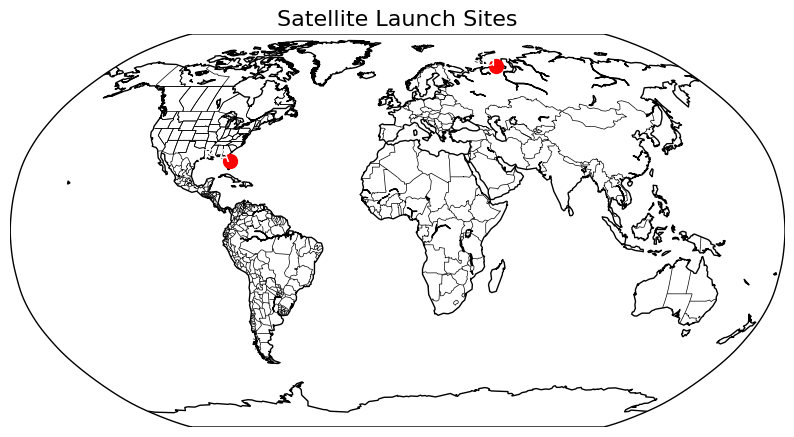

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Set up the map
fig, ax = plt.subplots(figsize=(10, 8))
m = Basemap(projection='robin', lon_0=0, resolution='c', ax=ax)

# Draw map elements
m.drawcountries()
m.drawcoastlines()
m.drawstates()

# Satellite launch sites (example coordinates)
launch_sites = {
    'USA': (-80.6, 28.4),  # Kennedy Space Center
    'Russia': (63.3, 69.6),  # Baikonur Cosmodrome
    'China': (40.96, 100.4)  # Jiuquan Satellite Launch Center
}

# Plot launch sites
for country, (lon, lat) in launch_sites.items():
    x, y = m(lon, lat)
    m.scatter(x, y, color='red', s=100, marker='o', zorder=10)
    plt.text(x, y, country, color='white', fontsize=12, ha='right', zorder=10)

# Title
plt.title("Satellite Launch Sites", fontsize=16)

# Show the plot
plt.show()


In [39]:
import pandas as pd
import plotly.express as px
import pycountry

# Load the satellite data (replace with your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Create a dictionary to map country acronyms (ISO 3166-1 alpha-2) to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Generate the choropleth map
fig_1 = px.choropleth(launch_counts_by_country, 
                    locations='Country', 
                    locationmode='country names', 
                    color='Launch_Count',
                    color_continuous_scale="YlOrRd",  # Color scale
                    labels={'Launch_Count': 'Number of Satellite Launches'},
                    title="Satellite Launch Heatmap by Country")

# Show the map
fig_1.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="lightgray")
fig_1.show()


In [21]:
import pandas as pd
import plotly.express as px
import pycountry

# Load the satellite data (replace with your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Create a dictionary to map country acronyms (ISO 3166-1 alpha-2) to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Generate the choropleth map
fig = px.choropleth(launch_counts_by_country, 
                    locations='Country', 
                    locationmode='country names', 
                    color='Launch_Count',
                    color_continuous_scale="YlOrRd",  # Color scale
                    labels={'Launch_Count': 'Number of Satellite Launches'},
                    title="Satellite Launch Heatmap by Country\n(Top Launching Nations: USA, Russia, China)")

# Set the color range for the map (optional, based on your data)
max_value = launch_counts_by_country['Launch_Count'].max()
min_value = launch_counts_by_country['Launch_Count'].min()

# Update the color scale with the proper cmin and cmax values
fig.update_coloraxes(cmin=min_value, cmax=max_value)

# Add annotations for key countries (USA, Russia, China)
annotations = {
    'United States': "USA: Dominates the satellite launches",
    'Russia': "Russia: Strong contributor to satellite launches",
    'China': "China: A major player in satellite launches"
}

# Loop through key countries and add annotations
for country_name, annotation_text in annotations.items():
    if country_name in launch_counts_by_country['Country'].values:
        launch_count = launch_counts_by_country[launch_counts_by_country['Country'] == country_name]['Launch_Count'].values[0]
        fig.add_annotation(
            x=launch_count,
            y=country_name,
            text=annotation_text,
            showarrow=True,
            arrowhead=2,
            ax=-30,
            ay=-30,
            font=dict(size=12, color="white")
        )

# Update the layout to improve map styling
fig.update_layout(
    geo=dict(  
        showland=True, landcolor="lightgray",  # Light gray for land areas
        showocean=True, oceancolor="lightblue",  # Light blue for ocean areas
        showcoastlines=True, coastlinecolor="black"
    ),
    paper_bgcolor="white",  # Set background to white for a clean look
    font=dict(family="Arial", size=12, color="black"),  # Customize font
)

# Add a text box for additional information or source
fig.add_annotation(
    x=0.5, y=-0.1,  # Adjust the position of the text box
    text="Data Source: Satellite Launch Data (2010-2023)",
    showarrow=False,
    font=dict(size=10, color="black"),
    align="center",
    bgcolor="white",
    borderpad=5
)

# Show the map
fig.show()


In [22]:
import pandas as pd
import plotly.express as px
import pycountry

# Load the satellite data (replace with your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Create a dictionary to map country acronyms (ISO 3166-1 alpha-2) to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Generate the choropleth map again
fig = px.choropleth(launch_counts_by_country, 
                    locations='Country', 
                    locationmode='country names', 
                    color='Launch_Count',
                    color_continuous_scale="YlOrRd",  # Color scale
                    labels={'Launch_Count': 'Number of Satellite Launches'},
                    title="Satellite Launch Heatmap by Country\n(Top Launching Nations: USA, Russia, China)")

# Set the color range for the map (optional, based on your data)
max_value = launch_counts_by_country['Launch_Count'].max()
min_value = launch_counts_by_country['Launch_Count'].min()

# Update the color scale with the proper cmin and cmax values
fig.update_coloraxes(cmin=min_value, cmax=max_value)

# Update the layout to improve map styling
fig.update_layout(
    geo=dict(  
        showland=True, landcolor="lightgray",  # Light gray for land areas
        showocean=True, oceancolor="lightblue",  # Light blue for ocean areas
        showcoastlines=True, coastlinecolor="black"
    ),
    paper_bgcolor="white",  # Set background to white for a clean look
    font=dict(family="Arial", size=12, color="black"),  # Customize font
)

# Add a text box for additional information or source
fig.add_annotation(
    x=0.5, y=-0.1,  # Adjust the position of the text box
    text="Data Source: Satellite Launch Data (2010-2023)",
    showarrow=False,
    font=dict(size=10, color="black"),
    align="center",
    bgcolor="white",
    borderpad=5
)

# Show the updated map
fig.show()



In [23]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

# Load the satellite data (your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Map country acronyms to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Create the 'Year' column from 'LDate' using .loc to avoid the warning
satcat_data_clean.loc[:, 'Year'] = pd.to_datetime(satcat_data_clean['LDate'], errors='coerce').dt.year

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean.groupby('Country').size().reset_index(name='Launch_Count')

# Coordinates of countries (using approximations for simplicity, this can be enhanced with a full coordinate dataset)
country_coords = {
    'United States': {'lat': 37.0902, 'lon': -95.7129},
    'Russia': {'lat': 55.7558, 'lon': 37.6173},
    'China': {'lat': 35.8617, 'lon': 104.1954},
    'India': {'lat': 20.5937, 'lon': 78.9629},
    'Japan': {'lat': 36.2048, 'lon': 138.2529},
    'Germany': {'lat': 51.1657, 'lon': 10.4515},
    # Add other countries as needed
}

# Merge the country coordinates with the launch counts
launch_counts_by_country['Lat'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lat'))
launch_counts_by_country['Lon'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lon'))

# Filter out countries without coordinates
launch_counts_by_country = launch_counts_by_country.dropna(subset=['Lat', 'Lon'])

# Create the 3D Globe-like map with Plotly
fig = go.Figure(go.Scattergeo(
    locationmode='country names',
    locations=launch_counts_by_country['Country'],
    hoverinfo='location+name+text',  # Corrected hoverinfo format
    marker=dict(
        color=launch_counts_by_country['Launch_Count'],
        colorscale='Viridis',
        showscale=True,
        size=launch_counts_by_country['Launch_Count'] / 10,  # Adjust size for visibility
        opacity=0.6
    )
))

# Update layout to resemble a 3D globe
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue",
)

# Add a title and show the map
fig.update_layout(
    title="Global Satellite Launches by Country (3D Globe)",
    geo=dict(showframe=False, projection_scale=5)
)

# Show the figure
fig.show()


/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/4183089626.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

# Load the satellite data (your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Map country acronyms to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Create the 'Year' column from 'LDate'
satcat_data_clean.loc[:, 'Year'] = pd.to_datetime(satcat_data_clean['LDate'], errors='coerce').dt.year

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean.groupby('Country').size().reset_index(name='Launch_Count')

# Coordinates of countries (using approximations for simplicity)
country_coords = {
    'United States': {'lat': 37.0902, 'lon': -95.7129},
    'Russia': {'lat': 55.7558, 'lon': 37.6173},
    'China': {'lat': 35.8617, 'lon': 104.1954},
    'India': {'lat': 20.5937, 'lon': 78.9629},
    'Japan': {'lat': 36.2048, 'lon': 138.2529},
    'Germany': {'lat': 51.1657, 'lon': 10.4515},
    # Add other countries as needed
}

# Merge the country coordinates with the launch counts
launch_counts_by_country['Lat'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lat'))
launch_counts_by_country['Lon'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lon'))

# Filter out countries without coordinates
launch_counts_by_country = launch_counts_by_country.dropna(subset=['Lat', 'Lon'])

# Custom satellite positions above the USA, China, and Russia
satellite_positions = {
    'United States': {'lat': 37.0902 + 5, 'lon': -95.7129},  # Slightly above the USA
    'Russia': {'lat': 55.7558 + 5, 'lon': 37.6173},  # Slightly above Russia
    'China': {'lat': 35.8617 + 5, 'lon': 104.1954},  # Slightly above China
}

# Create the 3D Globe-like map with Plotly
fig = go.Figure(go.Scattergeo(
    locationmode='country names',
    locations=launch_counts_by_country['Country'],
    hoverinfo='location+name+text',  # Hover information
    marker=dict(
        color=launch_counts_by_country['Launch_Count'],
        colorscale='Viridis',
        showscale=True,
        size=launch_counts_by_country['Launch_Count'] / 10,  # Adjust size for visibility
        opacity=0.6
    )
))

# Plot satellites above the USA, Russia, and China
for country, coords in satellite_positions.items():
    fig.add_trace(go.Scattergeo(
        locationmode='country names',
        locations=[country],
        hoverinfo='location+name',
        mode='markers',
        marker=dict(
            symbol='circle',
            color='red',
            size=10,
            opacity=1
        ),
        lat=[coords['lat']],
        lon=[coords['lon']]
    ))

# Update layout to resemble a 3D globe
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue",
)

# Add a title and show the map
fig.update_layout(
    title="Global Satellite Launches with Satellites Above USA, China, and Russia",
    geo=dict(showframe=False, projection_scale=5)
)

# Show the figure
fig.show()


/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/2196292468.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

# Load the satellite data (your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Map country acronyms to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Create the 'Year' column from 'LDate'
satcat_data_clean.loc[:, 'Year'] = pd.to_datetime(satcat_data_clean['LDate'], errors='coerce').dt.year

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean.groupby('Country').size().reset_index(name='Launch_Count')

# Coordinates of countries (using approximations for simplicity)
country_coords = {
    'United States': {'lat': 37.0902, 'lon': -95.7129},
    'Russia': {'lat': 55.7558, 'lon': 37.6173},
    'China': {'lat': 35.8617, 'lon': 104.1954},
    'India': {'lat': 20.5937, 'lon': 78.9629},
    'Japan': {'lat': 36.2048, 'lon': 138.2529},
    'Germany': {'lat': 51.1657, 'lon': 10.4515},
    # Add other countries as needed
}

# Merge the country coordinates with the launch counts
launch_counts_by_country['Lat'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lat'))
launch_counts_by_country['Lon'] = launch_counts_by_country['Country'].map(lambda x: country_coords.get(x, {}).get('lon'))

# Filter out countries without coordinates
launch_counts_by_country = launch_counts_by_country.dropna(subset=['Lat', 'Lon'])

# Create the 3D Globe-like map with Plotly
fig = go.Figure()

# Plot the satellites above the USA, China, and Russia based on their launch counts
for index, row in launch_counts_by_country.iterrows():
    country = row['Country']
    launches = row['Launch_Count']
    
    if country in ['United States', 'Russia', 'China']:  # Only plot above these countries
        base_lat = country_coords[country]['lat']
        base_lon = country_coords[country]['lon']
        
        # We use a single trace per country, with size representing the launch count
        fig.add_trace(go.Scattergeo(
            locationmode='country names',
            locations=[country],
            hoverinfo='location+name+text',  # Hover information
            mode='markers',
            marker=dict(
                color='red',
                size=launches,  # Size of the marker corresponds to the number of launches
                opacity=0.6,
                showscale=True,
                colorscale='Viridis',
            ),
            lat=[base_lat],  # Set latitude
            lon=[base_lon],  # Set longitude
        ))

# Update layout to resemble a 3D globe
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue",
)

# Add a title and show the map
fig.update_layout(
    title="Global Satellite Launches with Satellites Above USA, China, and Russia",
    geo=dict(showframe=False, projection_scale=5)
)

# Show the figure
fig.show()


/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/2340653600.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
import plotly.graph_objects as go
import pandas as pd

# Define the coordinates of countries for Russia, China, and USA
country_coords = {
    'United States': {'lat': 37.0902, 'lon': -95.7129},
    'Russia': {'lat': 55.7558, 'lon': 37.6173},
    'China': {'lat': 35.8617, 'lon': 104.1954},
}

# Simulate satellite launch counts for demonstration (can be replaced with actual data)
satellite_launch_counts = {
    'United States': 250,
    'Russia': 150,
    'China': 100,
}

# Create the 3D Globe-like map with Plotly
fig = go.Figure()

# Plot satellites above the USA, China, and Russia
for country, coordinates in country_coords.items():
    lat = coordinates['lat']
    lon = coordinates['lon']
    launches = satellite_launch_counts[country]
    
    # Generate satellite markers above each country
    for i in range(launches):
        fig.add_trace(go.Scattergeo(
            locationmode='country names',
            locations=[country],
            hoverinfo='location+name+text',  # Hover information
            mode='markers',
            marker=dict(
                symbol='circle',
                color='red',
                size=6,  # Satellite size
                opacity=0.7
            ),
            lat=[lat + (i * 0.1)],  # Increment latitude for each satellite
            lon=[lon]  # Keep longitude fixed
        ))

# Create Earth representation (simple 3D globe)
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue",
)

# Add a title and show the map
fig.update_layout(
    title="Satellite Launches Above USA, China, and Russia",
    geo=dict(showframe=False, projection_scale=3)
)

# Show the figure
fig.show()


In [28]:
import pandas as pd
import plotly.express as px

# Sample satellite data (replace with actual data)
data = {
    'Satellite Name': ['Sat1', 'Sat2', 'Sat3', 'Sat4', 'Sat5', 'Sat6'],
    'Country': ['USA', 'China', 'Russia', 'USA', 'China', 'Russia'],
    'Mass (kg)': [1000, 2000, 1500, 1200, 1800, 1300],
    'Category': ['Communications', 'Research', 'Navigation', 'Communications', 'Research', 'Communications'],
    'Orbit Type': ['Low Earth Orbit', 'Geosynchronous Orbit', 'Medium Earth Orbit', 'Low Earth Orbit', 'Geosynchronous Orbit', 'Low Earth Orbit']
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Create the scatter plot with Plotly
fig = px.scatter(df, 
                 x="Orbit Type", 
                 y="Country", 
                 size="Mass (kg)",  # Size of the dots represents the satellite mass
                 color="Category",  # Color the dots based on satellite category
                 hover_name="Satellite Name",  # Display the satellite name on hover
                 title="Satellites in Space by Country and Orbit",
                 labels={"Orbit Type": "Orbit Type", "Country": "Country", "Mass (kg)": "Mass of Satellite (kg)"})

# Update the layout for better visual appearance
fig.update_layout(
    xaxis_title="Orbit Type",
    yaxis_title="Country",
    showlegend=True,
    legend_title="Category of Satellite"
)

# Show the plot
fig.show()


/Users/ziad/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [32]:
import pandas as pd
import plotly.express as px

# Load the satellite data (your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Clean data by dropping rows with NaN values in relevant columns
satcat_data_clean = satcat_data.dropna(subset=['State', 'Mass', 'OpOrbit', 'Type'])

# Convert 'Mass' to numeric if it's not already and handle NaNs in 'Mass' column by filling them with 0
satcat_data_clean['Mass'] = pd.to_numeric(satcat_data_clean['Mass'], errors='coerce')
satcat_data_clean['Mass'].fillna(0, inplace=True)  # Fill NaNs with 0 (or you can use another strategy)

# Optional: Fill missing categories with a placeholder
satcat_data_clean['Type'] = satcat_data_clean['Type'].fillna('Unknown')  # Fill missing categories

# Create the scatter plot infographic
fig = px.scatter(satcat_data_clean, 
                 x='OpOrbit', 
                 y='State', 
                 size='Mass',  # Size of the dots represents the satellite mass
                 color='Type',  # Color the dots based on satellite category
                 hover_name='Name',  # Hover to show the satellite's name
                 title="Satellites in Space by Country and Orbit Type",
                 labels={"OpOrbit": "Orbit Type", "State": "Country", "Mass": "Mass (kg)", "Type": "Satellite Category"})

# Customize layout for an infographic style
fig.update_layout(
    title="Satellites in Space by Country and Orbit Type",
    title_x=0.5,
    title_y=0.95,
    xaxis_title="Orbit Type",
    yaxis_title="Country",
    showlegend=True,
    legend_title="Category",
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background for infographic style
    hoverlabel=dict(bgcolor='white', font_size=12, font_family="Arial"),
    font=dict(family="Arial", size=12, color="black"),
    margin=dict(l=20, r=20, t=50, b=50),  # Reduce margins for a compact look
)

# Make the plot less interactive (minimal interaction)
fig.update_layout(dragmode='pan',  # Allow zoom and pan, but minimal interactivity
                  showlegend=True)

# Show the figure
fig.show()


/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/1408651691.py:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/Users/ziad/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [34]:
import pandas as pd
import plotly.express as px
import pycountry

# Load the satellite data (replace with your file path)
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Create a dictionary to map country acronyms (ISO 3166-1 alpha-2) to full country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}

# Map the acronyms in the 'State' column to the full country names
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)

# Remove rows with missing country names (if any)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Group the data by 'Country' and count the number of launches
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Use Plotly to create a 3D scatter plot (globe)
fig = px.scatter_geo(launch_counts_by_country,
                     locations='Country', 
                     locationmode='country names',
                     size='Launch_Count',  # The size of the bubbles corresponds to the number of launches
                     color='Launch_Count',
                     color_continuous_scale="YlOrRd",  # Color scale
                     labels={'Launch_Count': 'Number of Satellite Launches'},
                     title="Satellite Launch Heatmap by Country (3D Globe)\n(Top Launching Nations: USA, Russia, China)")

# Set the layout to show a 3D globe
fig.update_geos(
    projection_type="orthographic",  # 3D globe projection
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="lightblue",
    showcoastlines=True,
    coastlinecolor="black",
)

# Use this line to set consistent coloring range for both 2D and 3D maps
fig.update_traces(marker=dict(size=8, colorbar=dict(title="Number of Satellite Launches")))
fig.update_coloraxes(cmin=min_value, cmax=max_value)  # Apply color scale

# Add annotation and layout details
fig.update_layout(
    geo=dict(projection_scale=1.8),
    paper_bgcolor="white",
    font=dict(family="Arial", size=12, color="black"),  # Customize font
)

fig.show()



In [40]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from dash import Dash, dcc, html, Input, Output


df = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

df['LAUNCH_DATETIME'] = pd.to_datetime(df['LDate'], errors='coerce')

df['LAUNCH_YEAR'] = df['LAUNCH_DATETIME'].dt.year

df = df.dropna(subset=['LAUNCH_DATETIME'])
df['Type'] = df['Type'].fillna('Unknown')
df['Status'] = df['Status'].fillna('Unknown')

available_types = ['All'] + sorted(df['Type'].unique())
available_statuses = ['All'] + sorted(df['Status'].unique())

total_satellites = df.shape[0]


top_4_countries = df['State'].value_counts().head(4)

most_common_type = df['Type'].value_counts().idxmax()
most_common_type_count = df['Type'].value_counts().max()


coarse_type_map = {
    'P': 'Payload',
    'C': 'Component',
    'R': 'Rocket Stage',
    'D': 'Debris',
    'S': 'Suborbital',
    'Z': 'Spurious',
    'X': 'Deleted',
}
def extract_type_category(sattype):
    if isinstance(sattype, str) and sattype.strip():
        key = sattype.strip()[0]
        return coarse_type_map.get(key, 'Other')
    return 'Unknown'

df['TypeCategory'] = df['Type'].apply(extract_type_category)
available_categories = ['All'] + sorted(df['TypeCategory'].unique())

status_category_map = {
    'O': 'Active',
    'AO': 'Active',
    'OX': 'Inactive',
    'N': 'Inactive',
    'R': 'Reentered',
    'D': 'Reentered',
    'AR': 'Reentered',
    'L': 'Landed',
    'AL': 'Landed',
    'E': 'Destroyed',
    'C': 'Destroyed',
    'F': 'Destroyed',
    'DSO': 'Deep Space',
    'DSA': 'Deep Space',
}

df['StatusCategory'] = df['Status'].map(status_category_map).fillna('Other')

available_statuses = ['All'] + sorted(df['StatusCategory'].unique())


df['State'] = df['State'].replace({'SU': 'SU + RU', 'RU': 'SU + RU'})

total_satellites = len(df)

status_counts = df['StatusCategory'].value_counts()

active_count = status_counts.get('Active', 0)
inactive_count = status_counts.get('Inactive', 0)
other_count = total_satellites - active_count - inactive_count

orbit_mapping = {
    'LLEO/E': 'Low Earth Orbit',
    'LLEO/I': 'Low Earth Orbit',
    'LLEO/P': 'Low Earth Orbit',
    'LLEO/S': 'Low Earth Orbit',
    'LLEO/R': 'Low Earth Orbit',
    'LEO/E': 'Low Earth Orbit',
    'LEO/I': 'Low Earth Orbit',
    'LEO/P': 'Low Earth Orbit',
    'LEO/S': 'Low Earth Orbit',
    'LEO/R': 'Low Earth Orbit',
    'MEO': 'Medium Earth Orbit',
    'HEO': 'High Earth Orbit',
    'HEO/M': 'High Earth Orbit',
    'GEO/S': 'Geostationary Orbit',
    'GEO/I': 'Geosynchronous Orbit',
    'GEO/T': 'Geosynchronous Orbit',
    'GEO/D': 'Geosynchronous Orbit',
    'GEO/SI': 'Geosynchronous Orbit',
    'GEO/ID': 'Geosynchronous Orbit',
    'GEO/NS': 'Geosynchronous Orbit',
    'GTO': 'Geostationary Transfer Orbit',
    'DSO': 'Deep Space Orbit',
    'CLO': 'Cislunar/Translunar Orbit',
    'EEO': 'Earth Escape Orbit',
    'ATM': 'Atmospheric',
    'SO': 'Suborbital',
    'TA': 'Trans-Atmospheric',
    'VHEO': 'Very High Earth Orbit',
    'HCO': 'Heliocentric Orbit',
    'PCO': 'Planetary-Centered Orbit',
}



df['OrbitCategory'] = df['OpOrbit'].apply(lambda x: orbit_mapping.get(str(x).strip(), 'Other'))
available_orbits = ['All'] + sorted(df['OrbitCategory'].unique())
def launch_dashboard():
    return html.Div([
        html.Div([
            html.Label("Satellite Type Category", style={'color': 'white'}),
            dcc.Dropdown(
                id='selected_type',
                options=[{'label': t, 'value': t} for t in available_categories],
                value='All',
                clearable=False
            )
        ], style={'width': '30%', 'display': 'inline-block', 'paddingRight': '2%', 'paddingLeft': '2%'}),
        html.Div([
            html.Label("Satellite Status Category", style={'color': 'white'}),
            dcc.Dropdown(
                id='selected_status',
                options=[{'label': s, 'value': s} for s in available_statuses],
                value='All',
                clearable=False
            )
        ], style={'width': '30%', 'display': 'inline-block', 'paddingRight': '2%'}),
        html.Div([
            html.Label("Satellite Orbit Category", style={'color': 'white'}),
            dcc.Dropdown(
                id='selected_orbits',
                options=[{'label': o, 'value': o} for o in available_orbits],
                value='All',
                clearable=False
            )
        ], style={'width': '30%', 'display': 'inline-block'}),

        html.Div([
            dcc.Graph(id='bar-race')
        ], style={'paddingTop': '30px'})


    ], style={'marginTop': '50px'})
app = Dash(__name__)
server = app.server

def kpi_card(title, value, color):
    return html.Div([
        html.Div([
            html.H4(title, style={'marginBottom': '5px', 'color': 'white'}),
            html.H2(value, style={'color': color, 'margin': 0})
        ], style={
            'backgroundColor': '#1f2c56',
            'padding': '20px',
            'borderRadius': '10px',
            'boxShadow': '0 4px 12px rgba(0,0,0,0.15)',
            'textAlign': 'center',
            'width': '100%'
        })
    ], style={'flex': 1, 'padding': '10px'})

def infographic_section():
    return html.Div([
      
        html.Div([dcc.Graph(id='infographic-1', figure=fig_1)], style={'flex': 1, 'padding': '10px'})
    ], style={
        'display': 'flex',
        'flexWrap': 'wrap',
        'marginTop': '20px'
    })



app.layout = html.Div(style={'backgroundColor': '#0e1a35', 'minHeight': '100vh', 'padding': '30px'}, children=[
    html.H1("Satellite Dashboard", style={'textAlign': 'center', 'color': 'white', 'marginBottom': '40px'}),

    html.Div([
        kpi_card("Total Satellites", total_satellites, '#00ccff'),
        kpi_card("Active Satellites", active_count, '#00e396'),
        kpi_card("Inactive/Retired", inactive_count, '#ff4d4f'),
        kpi_card("Other", other_count, '#FFFF00'),
    ], style={'display': 'flex', 'flexWrap': 'wrap'}),

    
    infographic_section(),

    launch_dashboard()
])


@app.callback(
    Output('bar-race', 'figure'),
    [Input('selected_type', 'value'),
     Input('selected_status', 'value'),
    Input('selected_orbits', 'value')]
)
def update_chart(selected_type, selected_status, selected_orbits):
    filtered_df = df.copy()

    if selected_type != 'All':
        filtered_df = filtered_df[filtered_df['TypeCategory'] == selected_type]

    if selected_status != 'All':
        filtered_df = filtered_df[filtered_df['StatusCategory'] == selected_status]
        
    if selected_orbits != 'All':
        filtered_df = filtered_df[filtered_df['OrbitCategory'] == selected_orbits]

    launches = filtered_df.groupby(['LAUNCH_YEAR', 'State']).size().reset_index(name='Launches')

    years = range(int(launches['LAUNCH_YEAR'].min()), int(launches['LAUNCH_YEAR'].max()) + 1)
    countries = launches['State'].unique()
    full_index = pd.MultiIndex.from_product([years, countries], names=['LAUNCH_YEAR', 'State'])
    launches = launches.set_index(['LAUNCH_YEAR', 'State']).reindex(full_index, fill_value=0).reset_index()

    launches = launches.sort_values(by=['State', 'LAUNCH_YEAR'])
    launches['Cumulative'] = launches.groupby('State')['Launches'].cumsum()

    top_total = launches.groupby('State')['Cumulative'].max().nlargest(10).index.tolist()
    launches = launches[launches['State'].isin(top_total)]

    launches = launches.sort_values(['LAUNCH_YEAR', 'Cumulative'], ascending=[True, False])
    launches['Rank'] = launches.groupby('LAUNCH_YEAR')['Cumulative'].rank(method='first', ascending=False)
    launches = launches[launches['Rank'] <= 10]
    launches['State'] = launches['State'].astype(str)

    fig = px.bar(
        launches,
        x='Cumulative',
        y='State',
        animation_frame='LAUNCH_YEAR',
        color='State',
        orientation='h',
        text='Cumulative',
        labels={'Cumulative': 'Total Launches', 'State': 'Country'},
        range_x=[0, launches['Cumulative'].max() + 50],
        height=700,
        title="🚀 Top 10 Countries by Cumulative Satellite Launches"
    )

    fig.update_traces(texttemplate='%{x}', textposition='inside')
    fig.update_layout(
            updatemenus=[{
            'type': 'buttons',
            'direction': 'left',
            'showactive': False,
            'x': 0.1,  
            'xanchor': 'right',
            'y': 1.35,  
            'yanchor': 'top',
        }],
            sliders=[{
                'active': 0,
                'yanchor': 'top',
                'xanchor': 'left',
                'currentvalue': {
                    'font': {'size': 20},
                    'prefix': 'Year:',
                    'visible': True,
                    'xanchor': 'right'
                },
                'transition': {'duration': 300, 'easing': 'cubic-in-out'},
                'pad': {'b': 10, 't': 50}, 
                'len': 0.9,
                'x': 0.1,
                'y': 1.35  
            }],
            template='plotly_dark',
            font=dict(size=14),
            title_font=dict(size=24),
            transition=dict(duration=700),
            showlegend=False,
            margin=dict(l=50, r=50, t=200, b=40),  
            yaxis={'categoryorder': 'total ascending'},
            plot_bgcolor='#1f2c56',
            paper_bgcolor='#1f2c56',
            font_color='white'
        )
    return fig


if __name__ == '__main__':
    app.run(debug=True)

In [36]:
!pip install dash 

  Obtaining dependency information for dash from https://files.pythonhosted.org/packages/4e/52/a4d1320ab57402d0cbe7e70e3bad72524bb66b86973a0330b372f3ce47b2/dash-3.0.2-py3-none-any.whl.metadata
  Obtaining dependency information for retrying from https://files.pythonhosted.org/packages/8f/04/9e36f28be4c0532c0e9207ff9dc01fb13a2b0eb036476a213b0000837d0e/retrying-1.3.4-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 11.8 MB/s eta 0:00:0000:0100:01


In [42]:
import pandas as pd
import plotly.express as px
import pycountry

# Load the data
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Map ISO codes to country names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Count launches by country
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Get top 3 countries for storytelling
top3 = launch_counts_by_country.nlargest(3, 'Launch_Count')

# Generate map
fig = px.choropleth(
    launch_counts_by_country,
    locations='Country',
    locationmode='country names',
    color='Launch_Count',
    color_continuous_scale="YlOrRd",
    labels={'Launch_Count': 'Satellite Launches'},
)

# Update color scale range
fig.update_coloraxes(cmin=0, cmax=launch_counts_by_country['Launch_Count'].max())

# Layout updates for infographic look
fig.update_layout(
    title={
        'text': f"🌍 Satellite Launch Heatmap by Country (2010–2023)<br>"
                f"<sup>USA, China, and Russia dominate with {top3['Launch_Count'].iloc[0]:,}+, "
                f"{top3['Launch_Count'].iloc[1]:,}, and {top3['Launch_Count'].iloc[2]:,} launches respectively.</sup>",
        'x': 0.5,
        'xanchor': 'center',
        'font': dict(size=22)
    },
    geo=dict(
        showland=True, landcolor="lightgray",
        showocean=True, oceancolor="lightblue",
        showcoastlines=True, coastlinecolor="white",
        projection_type="natural earth"
    ),
    margin=dict(l=30, r=30, t=100, b=70),
    font=dict(family="Arial", size=12),
    paper_bgcolor="white"
)

# Add annotations for the top 3
for i, row in top3.iterrows():
    fig.add_annotation(
        text=f"{row['Country']}<br>{row['Launch_Count']:,} launches",
        xref="paper", yref="paper",
        x=0.1 + i*0.3, y=-0.1,  # Adjust positions as needed
        showarrow=False,
        font=dict(size=11),
        align="center",
        bgcolor="white",
        bordercolor="black",
        borderwidth=1,
        borderpad=4
    )

# Source annotation
fig.add_annotation(
    text="Source: Satellite Catalog (2010–2023)",
    x=0.5, y=-0.2,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=10),
    align="center"
)

# Show the final map
fig.show()


In [71]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

# Load your satellite data
satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

# Map 2-letter country codes to full names
country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

# Count satellite launches
launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

# Top 5 countries
top5 = launch_counts_by_country.nlargest(5, 'Launch_Count')

# All recognized country names
all_countries = set([country.name for country in pycountry.countries])
launched_countries = set(launch_counts_by_country['Country'])

# African countries with no launches
african_country_codes = ['DZ','AO','BJ','BW','BF','BI','CM','CV','CF','TD','KM','CG','CD','DJ','EG','GQ','ER',
                         'SZ','ET','GA','GM','GH','GN','GW','CI','KE','LS','LR','LY','MG','MW','ML','MR','MU',
                         'MA','MZ','NA','NE','NG','RW','ST','SN','SC','SL','SO','ZA','SS','SD','TZ','TG','TN',
                         'UG','ZM','ZW']
african_no_launch = [country.name for country in pycountry.countries 
                     if country.alpha_2 in african_country_codes and country.name not in launched_countries]

african_no_launch_count = len(african_no_launch)
total_african_countries = len(african_country_codes)
african_no_launch_percentage = african_no_launch_count / total_african_countries * 100

# Create the choropleth map
fig = go.Figure(data=go.Choropleth(
    locations=launch_counts_by_country['Country'],
    locationmode='country names',
    z=launch_counts_by_country['Launch_Count'],
    colorscale='YlOrRd',
    colorbar_title='Launches',
    zmin=0,
    zmax=launch_counts_by_country['Launch_Count'].max(),
    marker_line_color='black',
))

# Update layout
fig.update_layout(
    title={
        'text': "Satellite Launch Heatmap by Country (2010–2023)<br>"
                "<sup>USA, China, and Russia dominate satellite launches; much of Africa remains absent.</sup>",
        'x': 0.5,
        'xanchor': 'center',
        'font': dict(size=22)
    },
    geo=dict(
        showland=True,
        landcolor="lightgray",
        showocean=True,
        oceancolor="lightblue",
        showcoastlines=True,
        coastlinecolor="white",
        projection_type="natural earth"
    ),
    margin=dict(l=30, r=30, t=120, b=120),
    font=dict(family="Arial", size=12),
    paper_bgcolor="white"
)

# Define better spaced x-positions for 3 annotations
annotation_x_positions = [0.15, 0.5, 0.8]

# Apply the improved layout
for i, row in top5.head(3).iterrows():
    fig.add_annotation(
        text=f" {row['Country']}: {row['Launch_Count']:,} launches",
        xref="paper", yref="paper",
        x=annotation_x_positions[i], y=-0.12,
        showarrow=False,
        font=dict(size=11),
        align="center",
        bgcolor="white",
        bordercolor="black",
        borderwidth=1,
        borderpad=4
    )

# Add Africa story annotation
fig.add_annotation(
    text=f"🌍 {african_no_launch_count}/54 African countries (~{african_no_launch_percentage:.1f}%) had zero launches.",
    xref="paper", yref="paper",
    x=0.5, y=-0.18,
    showarrow=False,
    font=dict(size=11, color="darkred"),
    align="center",
    bgcolor="white",
    bordercolor="darkred",
    borderwidth=1,
    borderpad=4
)

# Add source
fig.add_annotation(
    text="Source: Satellite Catalog (2010–2023)",
    xref="paper", yref="paper",
    x=0.5, y=-0.25,
    showarrow=False,
    font=dict(size=10),
    align="center"
)

fig.add_annotation(
    text="USA: 23,350 launches",
    x=-100,     # longitude
    y=30,       # latitude
    xref="geo", yref="geo",
    showarrow=False,
    font=dict(size=12, color="black"),
    bgcolor="white",
    borderpad=4
)


fig.show()


ValueError: 
    Invalid value of type 'builtins.str' received for the 'xref' property of layout.annotation
        Received value: 'geo'

    The 'xref' property is an enumeration that may be specified as:
      - One of the following enumeration values:
            ['paper']
      - A string that matches one of the following regular expressions:
            ['^x([2-9]|[1-9][0-9]+)?( domain)?$']

In [123]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

satcat_data = pd.read_csv('satcat.tsv', sep='\t', low_memory=False)

satcat_data.loc[satcat_data['State'] == 'SU', 'State'] = 'RU'

country_acronyms_full = {country.alpha_2: country.name for country in pycountry.countries}
satcat_data['Country'] = satcat_data['State'].map(country_acronyms_full)
satcat_data_clean = satcat_data.dropna(subset=['Country'])

launch_counts_by_country = satcat_data_clean['Country'].value_counts().reset_index(name="Launch_Count")
launch_counts_by_country.columns = ['Country', 'Launch_Count']

top5 = launch_counts_by_country.nlargest(5, 'Launch_Count')

african_country_codes = ['DZ','AO','BJ','BW','BF','BI','CM','CV','CF','TD','KM','CG','CD','DJ','EG','GQ','ER',
                         'SZ','ET','GA','GM','GH','GN','GW','CI','KE','LS','LR','LY','MG','MW','ML','MR','MU',
                         'MA','MZ','NA','NE','NG','RW','ST','SN','SC','SL','SO','ZA','SS','SD','TZ','TG','TN',
                         'UG','ZM','ZW']
all_countries = set([country.name for country in pycountry.countries])
launched_countries = set(launch_counts_by_country['Country'])

african_no_launch = [country.name for country in pycountry.countries 
                     if country.alpha_2 in african_country_codes and country.name not in launched_countries]

african_no_launch_count = len(african_no_launch)
total_african_countries = len(african_country_codes)
african_no_launch_percentage = african_no_launch_count / total_african_countries * 100

russia_total = launch_counts_by_country.loc[launch_counts_by_country['Country'] == 'Russian Federation', 'Launch_Count'].values[0]

fig = go.Figure(data=go.Choropleth(
    locations=launch_counts_by_country['Country'],
    locationmode='country names',
    z=launch_counts_by_country['Launch_Count'],
    colorscale='YlOrRd',
    colorbar_title='Launches',
    zmin=0,
    zmax=launch_counts_by_country['Launch_Count'].max(),
    marker_line_color='black',
))

fig.update_layout(
    title={
        'text': "Satellite Launch Heatmap by Country (2010–2023)<br>"
                "<sup>USA, China, and Russia (incl. USSR) dominate launches; much of Africa remains absent.</sup>",
        'x': 0.5,
        'xanchor': 'center',
        'font': dict(size=22)
    },
    geo=dict(
        showland=True,
        landcolor="lightgray",
        showocean=True,
        oceancolor="lightblue",
        showcoastlines=True,
        coastlinecolor="white",
        projection_type="natural earth"
    ),
    margin=dict(l=30, r=30, t=120, b=120),
    font=dict(family="Arial", size=12),
    paper_bgcolor="white"
)

fig.add_annotation(
    text="🇺🇸 USA: <b>23,350</b> launches",
    x=0.11, y=0.75,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=12),
    bgcolor="white",
    bordercolor="black",
    borderpad=3
)

fig.add_annotation(
    text=f"🇷🇺 Russia (incl. USSR): <b>{russia_total:,}</b> launches",
    x=1, y=0.95,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=12),
    bgcolor="white",
    bordercolor="black",
    borderpad=3
)

fig.add_annotation(
    text="🇨🇳 China: <b>8,536</b> launches",
    x=0.9, y=0.75,
    xref="paper", yref="paper",
    showarrow=False,
    font=dict(size=12),
    bgcolor="white",
    bordercolor="black",
    borderpad=3
)

fig.add_annotation(
    text=f"🌍 {african_no_launch_count}/54 African countries (~{african_no_launch_percentage:.1f}%) had zero launches.",
    xref="paper", yref="paper",
    x=0.5, y=-0.12,
    showarrow=False,
    font=dict(size=11, color="darkred"),
    align="center",
    bgcolor="white",
    bordercolor="darkred",
    borderwidth=1,
    borderpad=4
)

# Step 10: Add source note
fig.add_annotation(
    text="Source: Satellite Catalog (2010–2023)",
    xref="paper", yref="paper",
    x=0.5, y=-0.2,
    showarrow=False,
    font=dict(size=10),
    align="center"
)

# Step 11: Show final map
fig.show()


In [245]:
import pandas as pd
import plotly.graph_objects as go
import pycountry

# Load and prepare data
satcat_data = pd.read_csv("satcat.tsv", sep="\t", low_memory=False)
satcat_data['Launch Year'] = pd.to_datetime(satcat_data['LDate'], errors='coerce').dt.year
satcat_data.loc[satcat_data['State'] == 'SU', 'State'] = 'RU'
country_map = {c.alpha_2: c.name for c in pycountry.countries}
satcat_data['Country'] = satcat_data['State'].map(country_map)
satcat_data_clean = satcat_data.dropna(subset=['Country', 'Launch Year'])

years = list(range(1957, int(satcat_data_clean['Launch Year'].max()) + 1))
countries = satcat_data_clean['Country'].unique()
grid = pd.MultiIndex.from_product([years, countries], names=['Launch Year', 'Country'])

launch_counts = satcat_data_clean.groupby(['Launch Year', 'Country']).size()
launches_by_year = launch_counts.reindex(grid, fill_value=0).reset_index(name='Launch_Count')
launches_by_year['Cumulative_Launches'] = launches_by_year.groupby('Country')['Launch_Count'].cumsum()

first_launch_years = launches_by_year[launches_by_year['Cumulative_Launches'] > 0].groupby('Country')['Launch Year'].min()
launches_by_year['First_Launch_Year'] = launches_by_year['Country'].map(first_launch_years)
filtered = launches_by_year[launches_by_year['Launch Year'] >= launches_by_year['First_Launch_Year']]
launches_trimmed = filtered.copy()

annotations_timeline = [
    (1957, "🛰 Sputnik 1: First satellite (USSR)", 1.13, 0.9, 1),
    (1961, "🚀 Cold War space race escalates", 0.5, 1.05, 3),
    (1970, "🇨🇳 First Chinese satellite: Dong Fang Hong 1", 1.16, 0.7, 3),
    (1980, "🇷🇺 USSR pulls ahead of USA in total launches", 1.15, 0.85, 3),
    (1998, "🇪🇬 Egypt launches first African satellite", 0.9, 0.68, 2),
    (2000, "🇨🇳 China surges in launches", 1.03, 0.65, 2),
    (2012, "🇪🇺 Mini-satellite boom: 4+ European nations join space", 0.6, 0.9, 4),
    (2015, "🛰 Commercial CubeSat boom begins", 0.5, 0.1, 3),
    (2020, "🚀 Starlink deployment begins (USA)", -0.05, 0.65, 3),
    (2022, "🌐 3,000+ Starlink satellites", -0.05, 0.75, 3),
    (2025, "📡 Starlink dominates LEO", 0.2, 0.6, 1)
]

years_sorted = sorted(launches_trimmed['Launch Year'].unique())
frame_annotations = {year: [] for year in years_sorted}
for start_year, text, x, y, duration in annotations_timeline:
    for offset in range(duration):
        y_frame = start_year + offset
        if y_frame in frame_annotations:
            frame_annotations[y_frame].append(
                dict(
                    text=text,
                    x=x, y=y,
                    xref="paper", yref="paper",
                    showarrow=False,
                    bgcolor="white",
                    bordercolor="black",
                    borderpad=4,
                    font=dict(size=13)
                )
            )

frames = []
for year in years_sorted:
    frame_data = launches_trimmed[launches_trimmed['Launch Year'] == year]
    frames.append(go.Frame(
        data=[go.Choropleth(
            locations=frame_data['Country'],
            locationmode='country names',
            z=frame_data['Cumulative_Launches'],
            colorscale='YlOrRd',
            zmin=0,
            zmax=launches_trimmed['Cumulative_Launches'].max(),
            marker_line_color='black',
            colorbar_title='Cumulative Launches'
        )],
        name=str(year),
        layout=go.Layout(annotations=frame_annotations.get(year, [])) if frame_annotations.get(year) else go.Layout(annotations=[])
    ))

initial_year = launches_trimmed['Launch Year'].min()
initial_data = launches_trimmed[launches_trimmed['Launch Year'] == initial_year]

fig = go.Figure(
    data=go.Choropleth(
        locations=initial_data['Country'],
        locationmode='country names',
        z=initial_data['Cumulative_Launches'],
        colorscale='YlOrRd',
        zmin=0,
        zmax=launches_trimmed['Cumulative_Launches'].max(),
        marker_line_color='black',
        colorbar_title='Cumulative Launches'
    ),
    frames=frames
)

fig.update_layout(
    title=f"Cumulative Satellite Launches by Country (Time-Lapse: 1957–{years[-1]})",
    geo=dict(
        showland=True,
        landcolor="lightgray",
        showocean=True,
        oceancolor="lightblue",
        showcoastlines=True,
        coastlinecolor="white"
    ),
    paper_bgcolor="white",
    font=dict(family="Arial", size=12),
    margin=dict(l=30, r=30, t=80, b=30),
    updatemenus=[dict(
        type="buttons",
        direction="right",
        x=0.5, y=-0.01,
        xanchor="center", yanchor="top",
        buttons=[
            dict(label="▶ Play", method="animate", args=[None, {
                "frame": {"duration": 500, "redraw": True},
                "fromcurrent": True
            }]),
            dict(label="⏸ Pause", method="animate", args=[[None], {
                "frame": {"duration": 0, "redraw": False},
                "mode": "immediate"
            }])
        ],
        pad={"r": 10, "t": 10},
        showactive=False,
        bgcolor="white",
        borderwidth=1
    )],
    sliders=[dict(
        active=0,
        yanchor="top",
        xanchor="left",
        currentvalue={
            "prefix": "Launch Year = ",
            "font": {"size": 17}  
        },
        pad={"t": 30},
        steps=[
            dict(method="animate", args=[[str(year)], {
                "mode": "immediate",
                "frame": {"duration": 500, "redraw": True},
                "transition": {"duration": 0}
            }], label=str(year)) for year in years_sorted
        ]
    )]
)

fig.show()

/var/folders/rx/rqg7lddj29z_hp0qgdhvs36c0000gn/T/ipykernel_86790/764058043.py:89: UserWarning:

Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from current font.

/Users/ziad/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from current font.



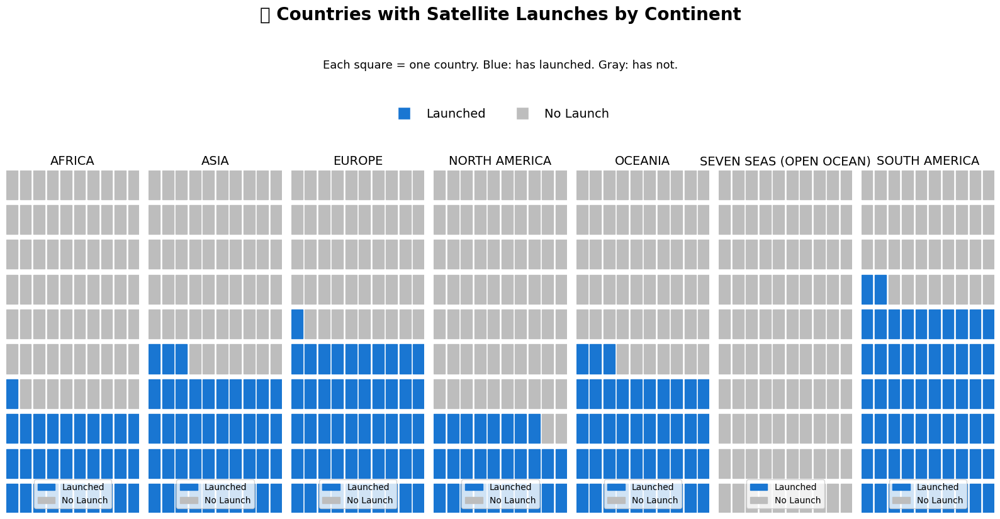

In [212]:
import pandas as pd
import matplotlib.pyplot as plt
from pywaffle import Waffle
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import pycountry
import geopandas as gpd

# Load SATCAT data
satcat = pd.read_csv("satcat.tsv", sep="\t", low_memory=False)

# Replace 'SU' with 'RU'
satcat.loc[satcat['State'] == 'SU', 'State'] = 'RU'

# Map 2-letter codes to country names
code_to_name = {country.alpha_2: country.name for country in pycountry.countries}
satcat['Country'] = satcat['State'].map(code_to_name)

# Drop rows with missing country names
satcat_clean = satcat.dropna(subset=['Country'])

# Get unique launching countries
launching_countries = set(satcat_clean['Country'].unique())

# Load world country shapefile (ensure you downloaded the full shapefile: .shp, .shx, .dbf, etc.)
world = gpd.read_file("ne_110m_admin_0_countries.shp")

# Use 'ADMIN' for country names and 'CONTINENT' for continents
world = world[world['ADMIN'] != "Antarctica"]
world['Launch'] = world['ADMIN'].apply(lambda x: 'Launched' if x in launching_countries else 'No Launch')

# Group by continent and launch status
continent_data = world.groupby(['CONTINENT', 'Launch']).size().unstack(fill_value=0)

# Prepare data for waffle plots
continent_data_dicts = []
for continent in continent_data.index:
    launched = continent_data.loc[continent].get('Launched', 0)
    no_launch = continent_data.loc[continent].get('No Launch', 0)
    continent_data_dicts.append({
        'continent': continent,
        'data': {
            'Launched': launched,
            'No Launch': no_launch
        }
    })

# Colors and legend setup
colors = ['#1976D2', '#BDBDBD']
legend_labels = ['Launched', 'No Launch']
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=15, label=label)
    for color, label in zip(colors, legend_labels)
]

# Plotting setup
num_continents = len(continent_data_dicts)
fig = plt.figure(figsize=(16, 9))
gs = GridSpec(3, num_continents, height_ratios=[0.2, 1, 0.05])

# Legend row
legend_ax = fig.add_subplot(gs[0, :])
legend_ax.axis('off')
legend_ax.legend(handles=legend_elements, loc='center', ncol=2, frameon=False, fontsize=14)

# Waffle chart grid
axes = [fig.add_subplot(gs[1, i]) for i in range(num_continents)]
for idx, continent_entry in enumerate(continent_data_dicts):
    ax = axes[idx]
    Waffle.make_waffle(
        rows=10,
        columns=10,
        values=continent_entry['data'],
        labels=None,
        vertical=True,
        title={
            'label': continent_entry['continent'].upper(),
            'loc': 'center',
            'fontsize': 14
        },
        colors=colors,
        ax=ax,
    )
    ax.axis('off')

# Title and layout
fig.suptitle("🌍 Countries with Satellite Launches by Continent", fontsize=20, fontweight='bold')
fig.text(0.5, 0.87, "Each square = one country. Blue: has launched. Gray: has not.", ha='center', fontsize=13)
plt.tight_layout()
plt.subplots_adjust(top=0.85)
plt.show()

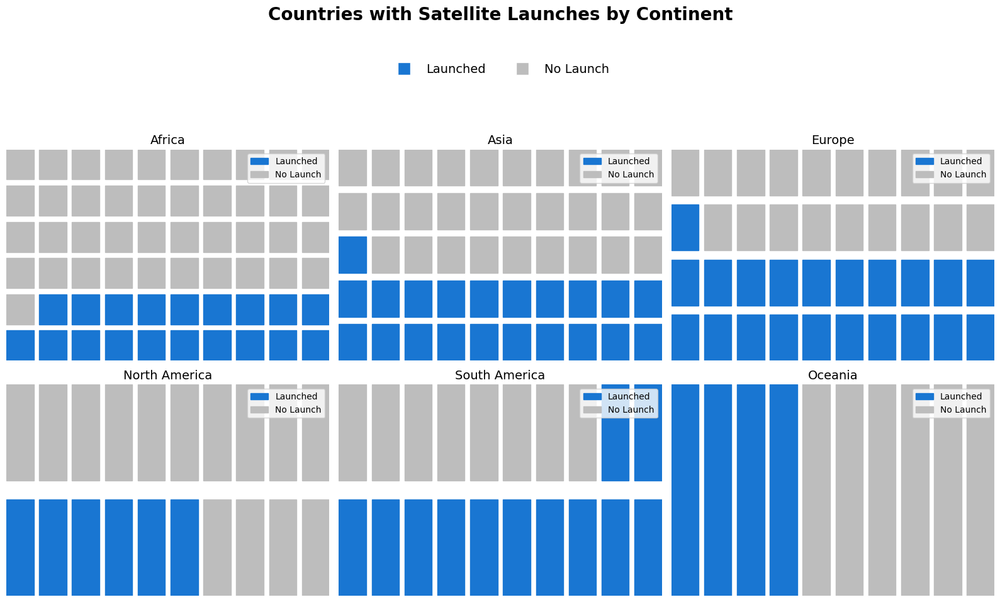

In [223]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
from pywaffle import Waffle
import geopandas as gpd
import pycountry

# --- Load SATCAT data ---
satcat = pd.read_csv("satcat.tsv", sep="\t", low_memory=False)
satcat.loc[satcat['State'] == 'SU', 'State'] = 'RU'
code_to_name = {c.alpha_2: c.name for c in pycountry.countries}
satcat['Country'] = satcat['State'].map(code_to_name)
satcat_clean = satcat.dropna(subset=['Country'])
launching_countries = set(satcat_clean['Country'].unique())

# --- Load world map ---
world = gpd.read_file("ne_110m_admin_0_countries.shp")
world = world[world['ADMIN'] != "Antarctica"]

# --- Keep 6 continents only ---
continents = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania']
world = world[world['CONTINENT'].isin(continents)]

# --- Tag each country with launch status ---
world['Launch'] = world['ADMIN'].apply(lambda x: 'Launched' if x in launching_countries else 'No Launch')

# --- Create data dictionary: one box = one country ---
continent_data = {}
for cont in continents:
    df = world[world['CONTINENT'] == cont]
    launched = df[df['Launch'] == 'Launched'].shape[0]
    no_launch = df[df['Launch'] == 'No Launch'].shape[0]
    continent_data[cont] = {'Launched': launched, 'No Launch': no_launch}

# --- Colors and legend setup ---
colors = ['#1976D2', '#BDBDBD']
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor=colors[0], markersize=15, label='Launched'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor=colors[1], markersize=15, label='No Launch')
]

# --- Figure and layout ---
fig = plt.figure(figsize=(16, 10))
gs = GridSpec(4, 3, height_ratios=[0.2, 0.05, 1, 1])

# Shared legend (top)
legend_ax = fig.add_subplot(gs[0, :])
legend_ax.axis('off')
legend_ax.legend(handles=legend_elements, loc='center', ncol=2, frameon=False, fontsize=14)

# Title
fig.text(0.5, 0.93, "Countries with Satellite Launches by Continent", ha='center', fontsize=20, fontweight='bold')

# --- Ordered continent layout (column major, top-to-bottom) ---
ordered_continents = [
    'Africa', 'North America',
    'Asia', 'South America',
    'Europe', 'Oceania'
]

# --- Draw waffle plots ---
for idx, continent in enumerate(ordered_continents):
    row = 2 + idx % 2  # Row 2 or 3
    col = idx // 2     # Column 0 to 2
    ax = fig.add_subplot(gs[row, col])
    
    total_countries = sum(continent_data[continent].values())
    columns = 10
    rows = (total_countries // columns) + (1 if total_countries % columns else 0)
    
    Waffle.make_waffle(
        values=continent_data[continent],
        rows=rows,
        columns=columns,
        colors=colors,
        labels=None,
        vertical=True,
        block_arranging_style='snake',
        ax=ax
    )
    ax.set_title(continent, fontsize=14)
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()


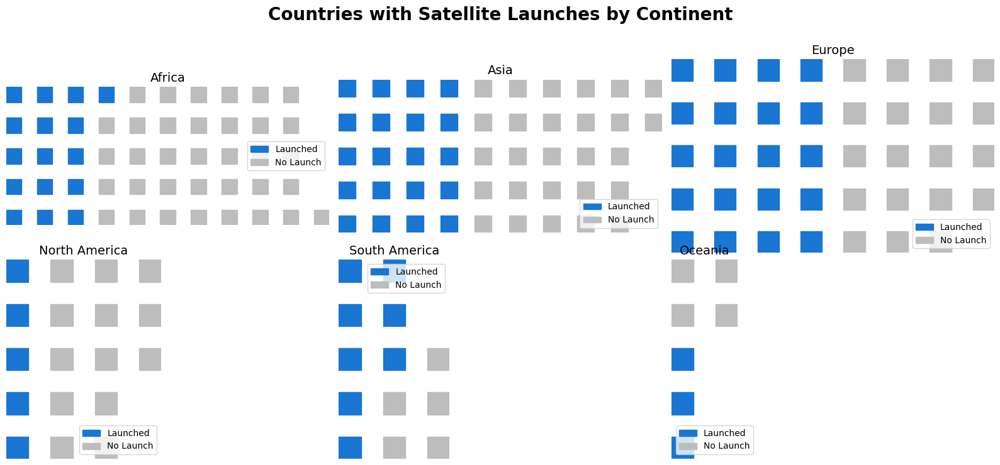

In [226]:
import pandas as pd
import matplotlib.pyplot as plt
from pywaffle import Waffle
import pycountry
import geopandas as gpd

# Load SATCAT data
satcat = pd.read_csv("satcat.tsv", sep="\t", low_memory=False)
satcat.loc[satcat['State'] == 'SU', 'State'] = 'RU'
code_to_name = {country.alpha_2: country.name for country in pycountry.countries}
satcat['Country'] = satcat['State'].map(code_to_name)
satcat_clean = satcat.dropna(subset=['Country'])
launching_countries = set(satcat_clean['Country'].unique())

# Load world countries with continent info
world = gpd.read_file("ne_110m_admin_0_countries.shp")
world = world[world['ADMIN'] != "Antarctica"]
continents = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania']
world = world[world['CONTINENT'].isin(continents)]

# Determine launch status
world['Launch'] = world['ADMIN'].apply(lambda x: 'Launched' if x in launching_countries else 'No Launch')

# Prepare data
continent_data = {}
for cont in continents:
    df = world[world['CONTINENT'] == cont]
    launched = df[df['Launch'] == 'Launched'].shape[0]
    no_launch = df[df['Launch'] == 'No Launch'].shape[0]
    continent_data[cont] = {'Launched': launched, 'No Launch': no_launch}

# Color palette
colors = ['#1976D2', '#BDBDBD']  # Blue = Launched, Gray = No Launch

# Plot grid layout
fig = plt.figure(
    FigureClass=Waffle,
    plots={
        (2, 3, i+1): {
            'values': continent_data[continent],
            'labels': None,
            'title': {
                'label': continent,
                'loc': 'center',
                'fontsize': 14
            },
            'colors': colors,
            'rows': 5,
            'block_arranging_style': 'snake',
            'interval_ratio_x': 1.0,
            'interval_ratio_y': 1.0
        }
        for i, continent in enumerate(continents)
    },
    figsize=(16, 8),
    tight=True
)

# Add Title and Legend
fig.suptitle("Countries with Satellite Launches by Continent", fontsize=20, fontweight='bold')
fig.legend(
    labels=['Launched', 'No Launch'],
    loc='lower center',
    ncol=2,
    fontsize=13,
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(top=0.88, bottom=0.08)
plt.show()

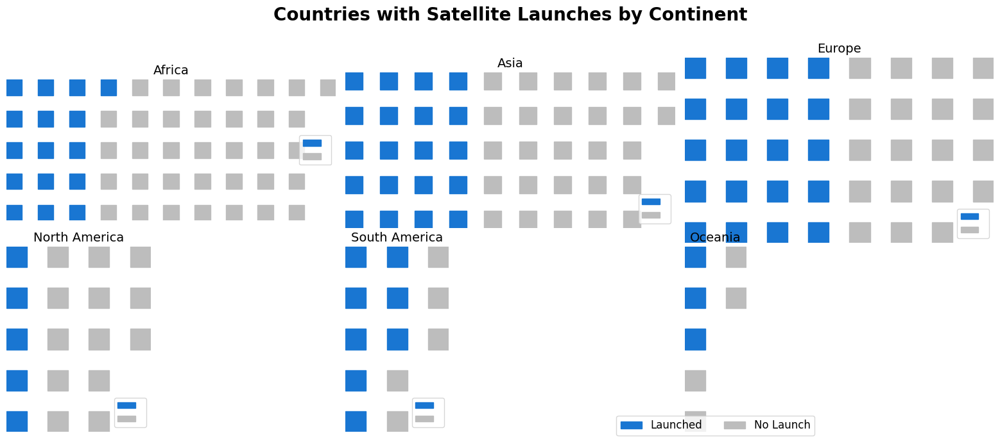

In [242]:
import pandas as pd
import matplotlib.pyplot as plt
from pywaffle import Waffle
import pycountry
import geopandas as gpd
import matplotlib.patches as mpatches

# Load SATCAT data
satcat = pd.read_csv("satcat.tsv", sep="\t", low_memory=False)
satcat.loc[satcat['State'] == 'SU', 'State'] = 'RU'
code_to_name = {country.alpha_2: country.name for country in pycountry.countries}
satcat['Country'] = satcat['State'].map(code_to_name)
satcat_clean = satcat.dropna(subset=['Country'])
launching_countries = set(satcat_clean['Country'].unique())

# Load world countries with continent info
world = gpd.read_file("ne_110m_admin_0_countries.shp")
world = world[world['ADMIN'] != "Antarctica"]
continents = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania']
world = world[world['CONTINENT'].isin(continents)]

# Determine launch status
world['Launch'] = world['ADMIN'].apply(lambda x: 'Launched' if x in launching_countries else 'No Launch')

# Prepare data
continent_data = {}
for cont in continents:
    df = world[world['CONTINENT'] == cont]
    launched = df[df['Launch'] == 'Launched'].shape[0]
    no_launch = df[df['Launch'] == 'No Launch'].shape[0]
    continent_data[cont] = {'Launched': launched, 'No Launch': no_launch}

# Color palette
colors = ['#1976D2', '#BDBDBD']  # Blue = Launched, Gray = No Launch

# Create the waffle chart
fig = plt.figure(
    FigureClass=Waffle,
    plots={
        (2, 3, i + 1): {
            'values': continent_data[continent],
            'labels': [''] * len(continent_data[continent]),  # No legends in subplots
            'colors': colors,
            'title': {'label': continent, 'loc': 'center', 'fontsize': 14},
            'rows': 5,
            'block_arranging_style': 'grid',  # Fill column-wise (top to bottom)
            'interval_ratio_x': 1.0,
            'interval_ratio_y': 1.0,
        }
        for i, continent in enumerate(continents)
    },
    figsize=(16, 8),
    tight=True
)

# 🔁 Flip each subplot vertically to simulate bottom-to-top stacking
for ax in fig.axes:
    ax.invert_yaxis()

# Add a main title
fig.suptitle("Countries with Satellite Launches by Continent", fontsize=20, fontweight='bold')

# Add a global legend below the grid
blue_patch = mpatches.Patch(color='#1976D2', label='Launched')
gray_patch = mpatches.Patch(color='#BDBDBD', label='No Launch')
plt.legend(handles=[blue_patch, gray_patch], loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=2, fontsize=12)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.88, bottom=0.15)

# Show the plot
plt.show()